<div style="text-align:center">
    <h1>Supernovae times and locations</h1>
    <p style="text-align:center">FIRE (and other codes) currently assume that all supernova happen within their parent cluster and also end after 37.53 Myr. Let's investigate whether that is actually the case</p>
</div>

In [1]:
import cogsworth
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import gala.dynamics as gd

In [2]:
%config InlineBackend.figure_format = 'retina'
plt.style.use("default")


pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

In [3]:
import pynbody

In [4]:
%%time
snap = cogsworth.hydro.utils.prepare_snapshot("/mnt/home/chayward/firesims/fire2/public_release/core/m11h_res7100/output/snapshot_600.hdf5")

/mnt/home/twagg/miniconda3/envs/cogsworth/lib/python3.10/site-packages/pynbody/snapshot/gadgethdf.py:555: RuntimeWarning: No unit information found in GadgetHDF file. Using gadget default units.
  warnings.warn("No unit information found in GadgetHDF file. Using gadget default units.", RuntimeWarning)
/mnt/home/twagg/cogsworth/cogsworth/hydro/utils.py:41: UserWarning: No halo catalogue found, using pynbody's built-in halo finder to centre the snapshot
  warnings.warn("No halo catalogue found, using pynbody's built-in halo finder to centre the snapshot")
/mnt/home/twagg/miniconda3/envs/cogsworth/lib/python3.10/site-packages/pynbody/snapshot/gadgethdf.py:394: UserWarning: Unable to infer units from HDF attributes
  warnings.warn("Unable to infer units from HDF attributes")


CPU times: user 36.1 s, sys: 7.17 s, total: 43.3 s
Wall time: 24.5 s


In [8]:
snap.properties["time"].in_units("Myr")

13736.521278830252

# Load the population

In [3]:
p = cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_1.0-ce_1.0")

In [67]:
random_bin_nums = np.random.choice(p.bin_nums, 10000, replace=False)

In [68]:
x = p[random_bin_nums]

In [4]:
from importlib import reload
import sys
sys.path.append("../src")
import plotting

In [5]:
reload(plotting)
plotting.set_sn_subpop_masks(p)

17068 247674 159305 313495


(2          False
 4          False
 12         False
 13         False
 14         False
            ...  
 2161111    False
 2161112    False
 2161114    False
 2161117    False
 2161120    False
 Name: bin_num, Length: 790647, dtype: bool,
 0          False
 2          False
 6          False
 11         False
 13         False
            ...  
 2161000    False
 2161001    False
 2161006    False
 2161011    False
 2161012    False
 Name: bin_num, Length: 395297, dtype: bool,
 2           True
 4          False
 12         False
 13          True
 14         False
            ...  
 2161111    False
 2161112    False
 2161114    False
 2161117    False
 2161120    False
 Name: bin_num, Length: 790647, dtype: bool,
 2          False
 4           True
 12          True
 13         False
 14          True
            ...  
 2161111    False
 2161112    False
 2161114    False
 2161117    False
 2161120    False
 Name: bin_num, Length: 790647, dtype: bool,
 0           True
 2        

In [114]:
sn_rows = p.bpp[((p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)) & ~p.bpp["bin_num"].isin(p.duplicate_sn)]
    
primary_sn_rows = sn_rows[sn_rows["evol_type"] == 15]
secondary_sn_rows = sn_rows[sn_rows["evol_type"] == 16]

In [336]:
initP_1 = p.initC["porb"].loc[p.bpp["bin_num"][(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]]
initP_2 = p.initC["porb"].loc[p.bpp["bin_num"][(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]]

init_mass_1 = p.initC["mass_1"].loc[p.bpp["bin_num"][(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]]
init_mass_2 = p.initC["mass_2"].loc[p.bpp["bin_num"][(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]]

Z_1 = p.initC["metallicity"].loc[p.bpp["bin_num"][(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]]
Z_2 = p.initC["metallicity"].loc[p.bpp["bin_num"][(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]]

ejecta_mass_1 = p.bpp["mass_1"].diff(-1).fillna(0.0)[(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]
ejecta_mass_2 = p.bpp["mass_2"].diff(-1).fillna(0.0)[(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]

co_mass_1 = p.bpp["mass_1"].shift(-1).fillna(0.0)[(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]
co_mass_2 = p.bpp["mass_2"].shift(-1).fillna(0.0)[(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]

In [240]:
uni[counts.argsort()][::-1]

array([20.06623794,  4.38889539,  4.38876909, ...,  7.6206264 ,
        7.62062844,  4.0000144 ])

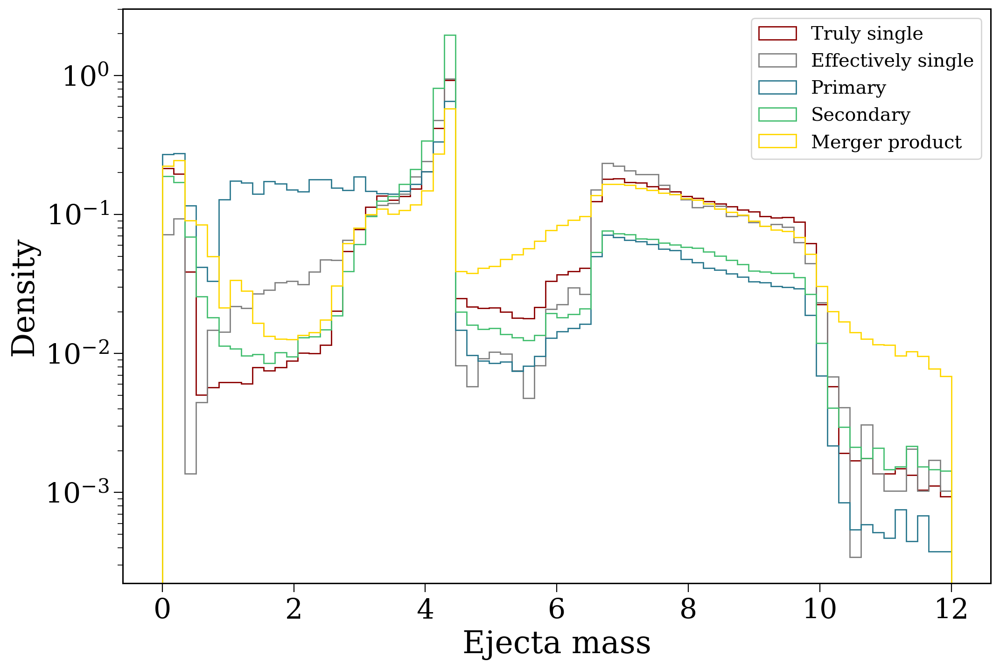

In [270]:
colours = ["darkred", "grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]
labels = ["Truly single", "Effectively single", "Primary", "Secondary", "Merger product"]
for c, d, l in zip(colours, [ejecta_mass_1[p.sn_truly_single],
                          np.concatenate((ejecta_mass_1[p.sn_1_singles],
                                          ejecta_mass_2[p.sn_2_singles])),
                          ejecta_mass_1[p.sn_1],
                          ejecta_mass_2[p.sn_2],
                          np.concatenate((ejecta_mass_1[p.sn_1_merger],
                                          ejecta_mass_2[p.sn_2_merger]))],
                   labels):
    plt.hist(d, bins=70, histtype="step", density=True, color=c, range=(0, 12), label=l)
plt.yscale("log")
plt.legend(fontsize=0.6 * fs)

plt.xlabel("Ejecta mass")
plt.ylabel("Density")

plt.show()

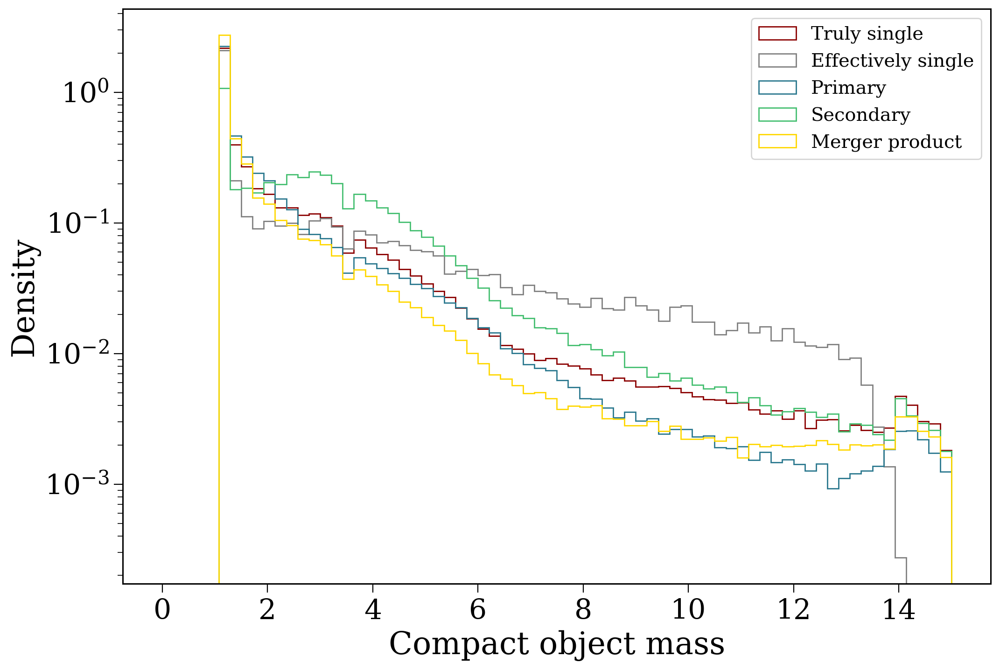

In [288]:
colours = ["darkred", "grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]
labels = ["Truly single", "Effectively single", "Primary", "Secondary", "Merger product"]
for c, d, l in zip(colours, [co_mass_1[p.sn_truly_single],
                          np.concatenate((co_mass_1[p.sn_1_singles],
                                          co_mass_2[p.sn_2_singles])),
                          co_mass_1[p.sn_1],
                          co_mass_2[p.sn_2],
                          np.concatenate((co_mass_1[p.sn_1_merger],
                                          co_mass_2[p.sn_2_merger]))],
                   labels):
    plt.hist(d, bins=70, histtype="step", density=True, color=c, range=(0, 15), label=l)
plt.yscale("log")
plt.legend(fontsize=0.6 * fs)

plt.xlabel("Compact object mass")
plt.ylabel("Density")

plt.show()

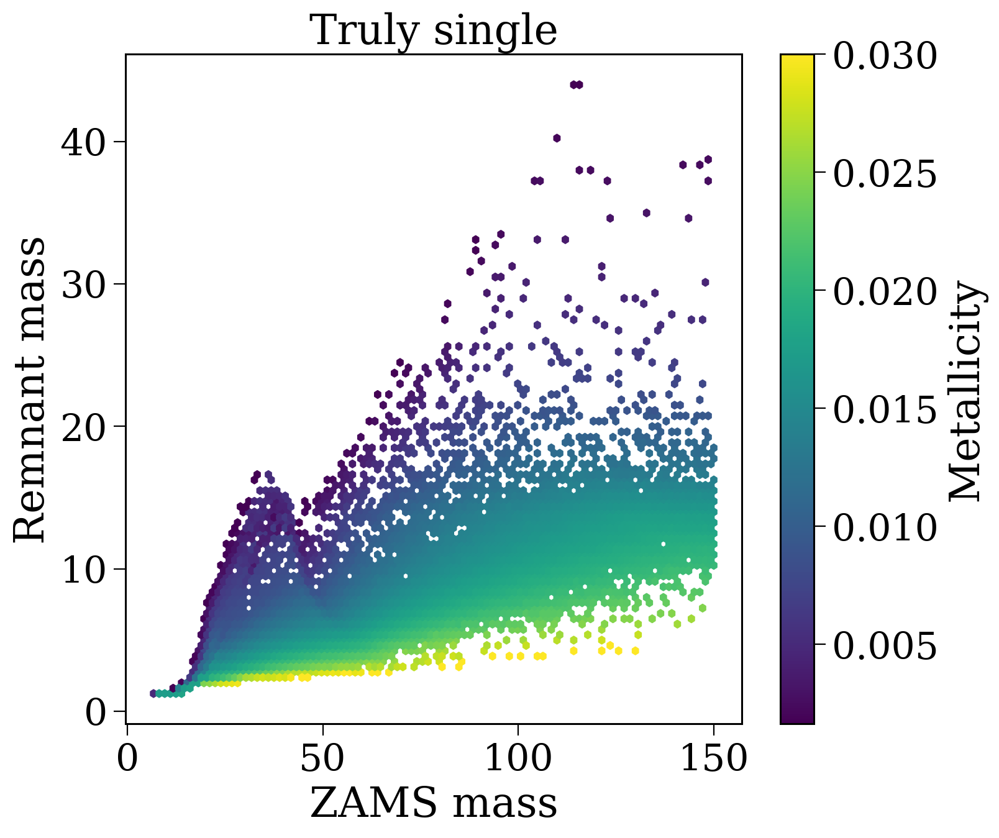

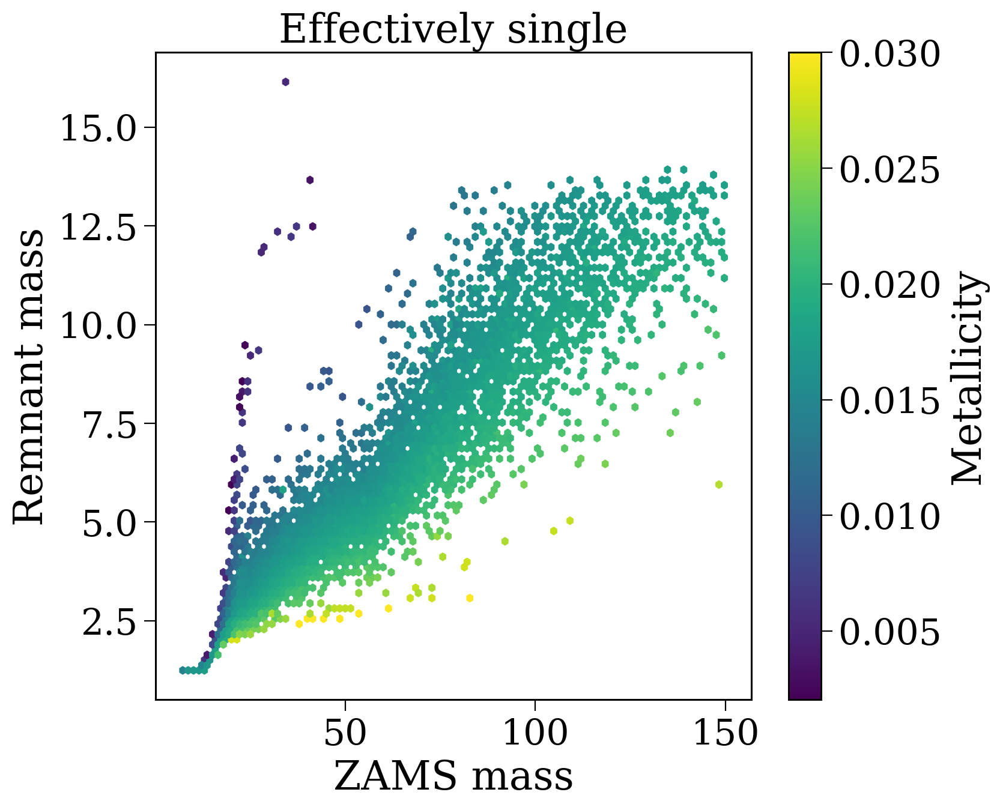

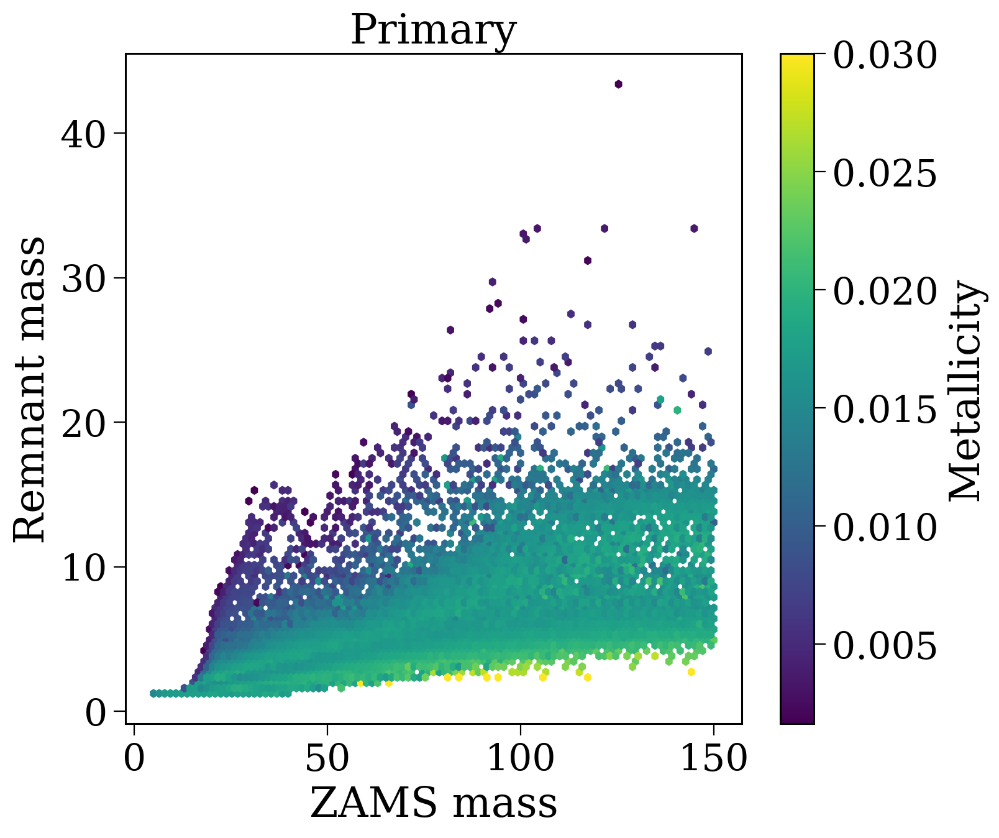

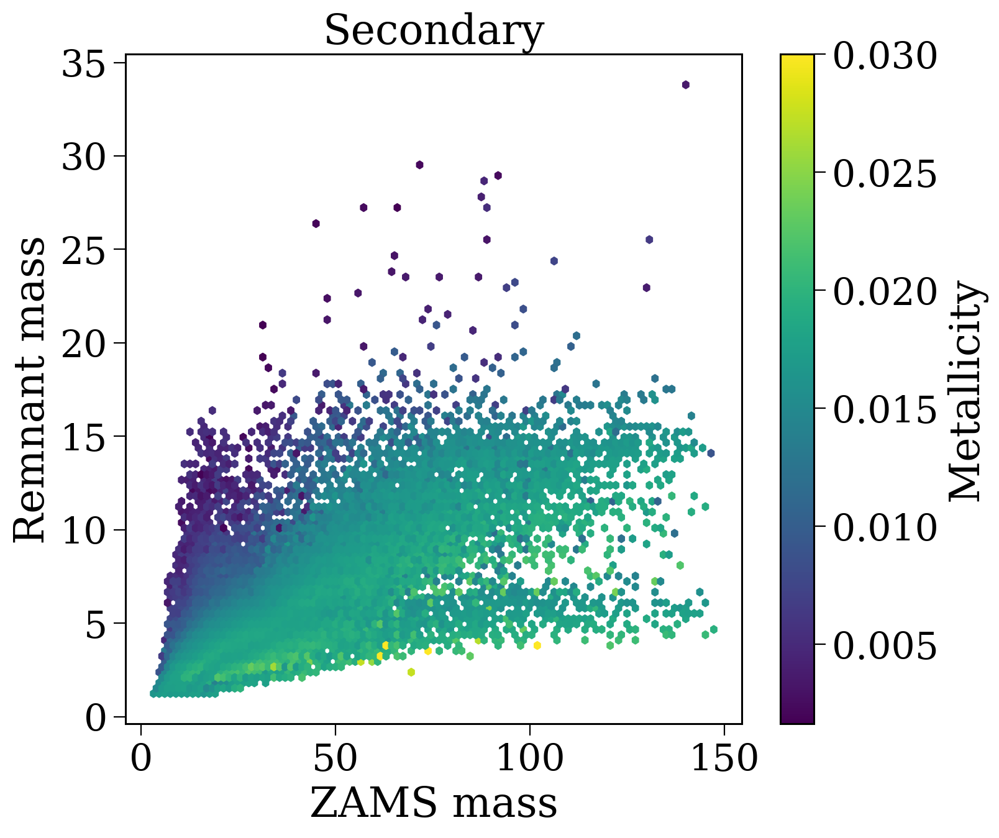

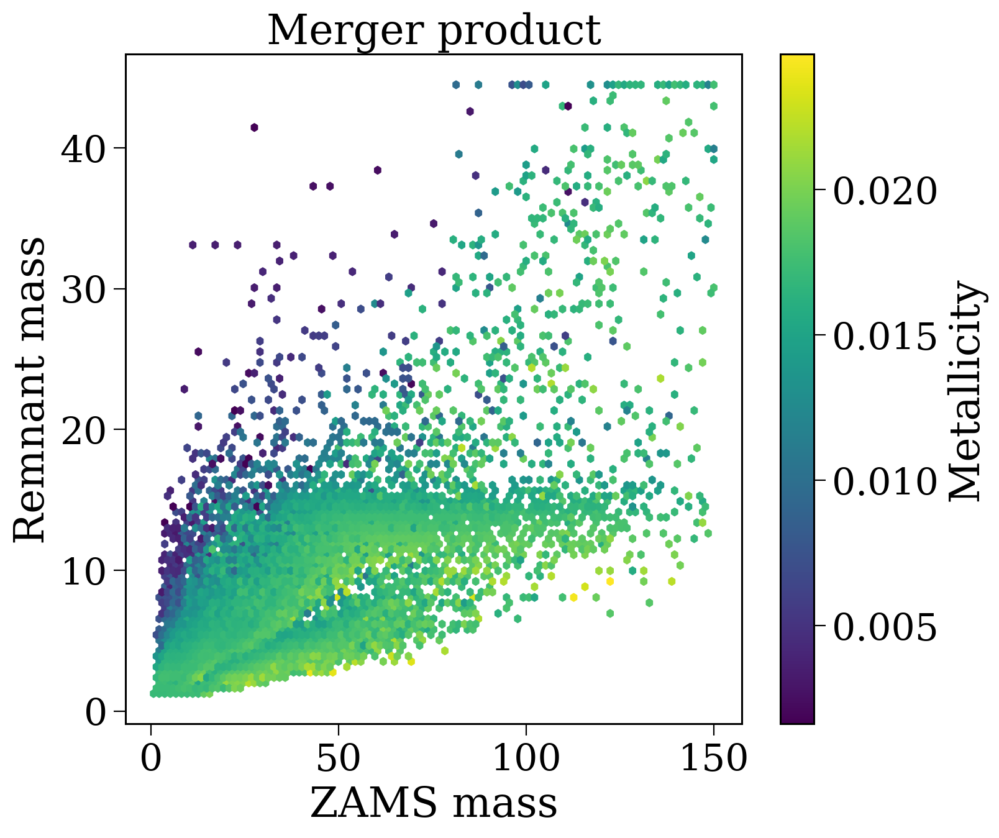

In [314]:
colours = ["darkred", "grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]
labels = ["Truly single", "Effectively single", "Primary", "Secondary", "Merger product"]
for c, im, com, Z, l in zip(colours,
                   [init_mass_1[p.sn_truly_single],
                          np.concatenate((init_mass_1[p.sn_1_singles],
                                          init_mass_2[p.sn_2_singles])),
                          init_mass_1[p.sn_1],
                          init_mass_2[p.sn_2],
                          np.concatenate((init_mass_1[p.sn_1_merger],
                                          init_mass_2[p.sn_2_merger]))],
                   [co_mass_1[p.sn_truly_single],
                          np.concatenate((co_mass_1[p.sn_1_singles],
                                          co_mass_2[p.sn_2_singles])),
                          co_mass_1[p.sn_1],
                          co_mass_2[p.sn_2],
                          np.concatenate((co_mass_1[p.sn_1_merger],
                                          co_mass_2[p.sn_2_merger]))],
                   [Z_1[p.sn_truly_single],
                          np.concatenate((Z_1[p.sn_1_singles],
                                          Z_2[p.sn_2_singles])),
                          Z_1[p.sn_1],
                          Z_2[p.sn_2],
                          np.concatenate((Z_1[p.sn_1_merger],
                                          Z_2[p.sn_2_merger]))],
                    labels):
    fig, ax = plt.subplots(figsize=(8, 7))
    # com = com[im < 26]
    # im = im[im < 26]
    hexbin = ax.hexbin(im, com, Z)
    fig.colorbar(hexbin, label="Metallicity")
    ax.set(xlabel="ZAMS mass", ylabel="Remnant mass", title=l)
    ax.set_title(l, fontsize=fs)
# plt.yscale("log")
# plt.legend(fontsize=0.6 * fs)

# plt.xlabel("Compact object mass")
# plt.ylabel("Density")

    plt.show()

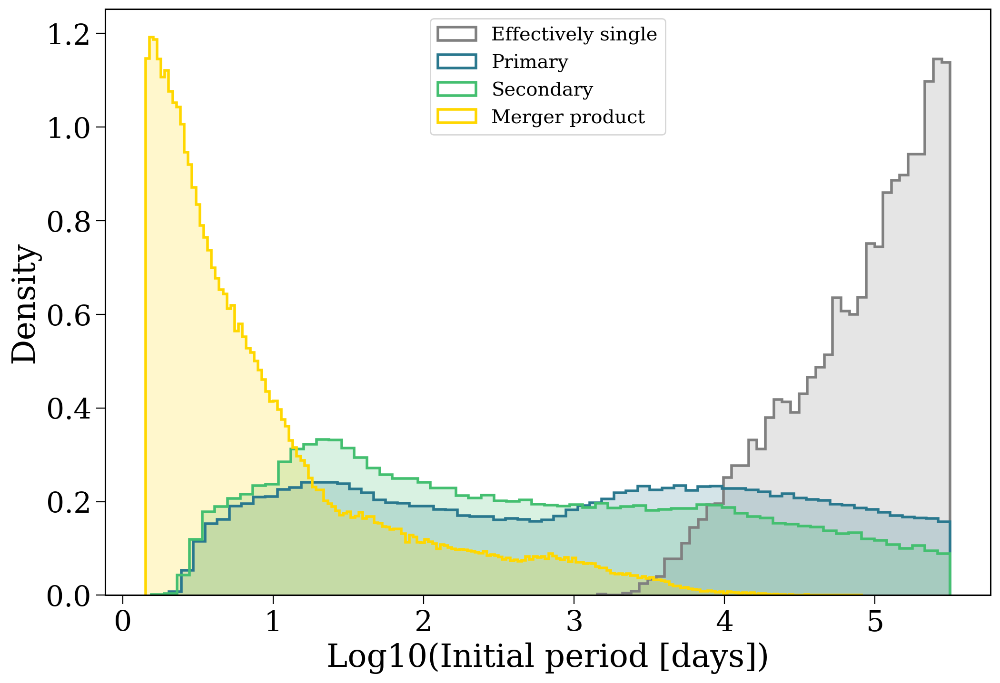

In [333]:
colours = ["darkred", "grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]
labels = ["Truly single", "Effectively single", "Primary", "Secondary", "Merger product"]

for c, d, l in zip(colours, [initP_1[p.sn_truly_single],
                          np.concatenate((initP_1[p.sn_1_singles],
                                          initP_2[p.sn_2_singles])),
                          initP_1[p.sn_1],
                          initP_2[p.sn_2],
                          np.concatenate((initP_1[p.sn_1_merger],
                                          initP_2[p.sn_2_merger]))],
                   labels):
    if any(d == -1):
        continue
    plt.hist(np.log10(d), bins="fd", density=True, color=c, alpha=0.2)
    plt.hist(np.log10(d), bins="fd", histtype="step", density=True, color=c, label=l, lw=2)
# plt.yscale("log")
plt.legend(fontsize=0.6 * fs)

plt.xlabel("Log10(Initial period [days])")
plt.ylabel("Density")

plt.show()

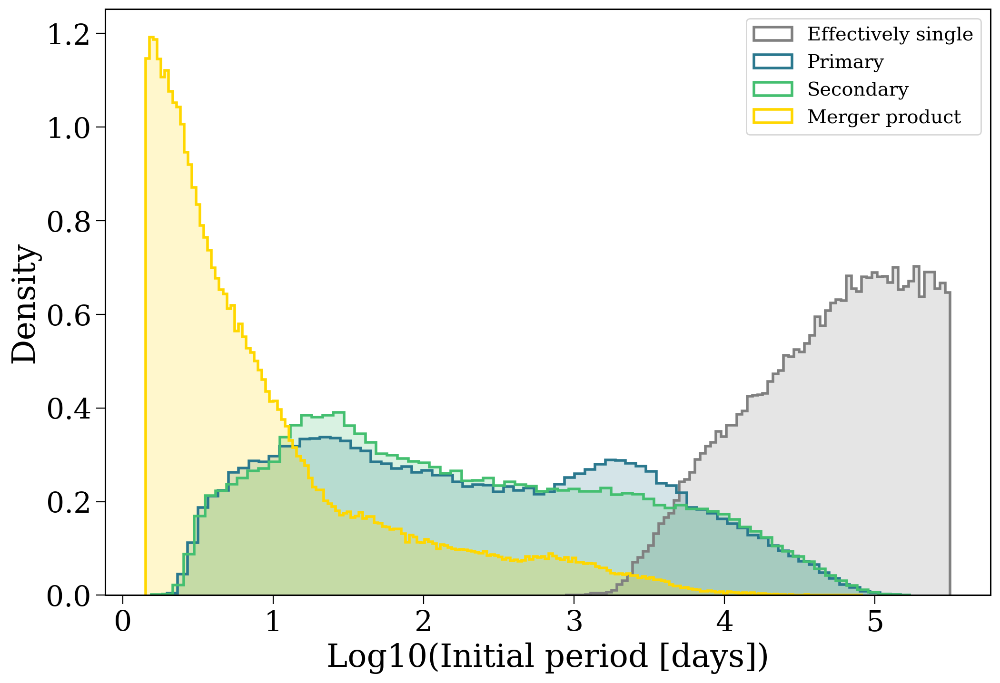

In [340]:
colours = ["darkred", "grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]
labels = ["Truly single", "Effectively single", "Primary", "Secondary", "Merger product"]

for c, d, l in zip(colours, [initP_1[p.sn_truly_single],
                          np.concatenate((initP_1[p.sn_1_singles],
                                          initP_2[p.sn_2_singles])),
                          initP_1[p.sn_1],
                          initP_2[p.sn_2],
                          np.concatenate((initP_1[p.sn_1_merger],
                                          initP_2[p.sn_2_merger]))],
                   labels):
    if any(d == -1):
        continue
    plt.hist(np.log10(d), bins="fd", density=True, color=c, alpha=0.2)
    plt.hist(np.log10(d), bins="fd", histtype="step", density=True, color=c, label=l, lw=2)
# plt.yscale("log")
plt.legend(fontsize=0.6 * fs)

plt.xlabel("Log10(Initial period [days])")
plt.ylabel("Density")

plt.show()

In [328]:
weirdos = p.bpp[(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]["bin_num"][(initP_1 > 3e5) & p.sn_1].values

In [332]:
p.bpp.loc[weirdos[2]]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
7386,0.000000,9.924991,7.054197,1.0,1.0,49942.577603,313920.819727,0.071432,0.000214,0.000205,1.0,0.000000,0.000000,2.403736e+01,4.765335e+01,0.000000,0.000000,4.064475,3.324902,9.924991,7.054197,5.479703e+03,1753.096874,24743.243247,20574.611501,0.000000,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.644471e+03,3271.988319,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,7386
7386,24.462321,9.662060,7.038524,2.0,1.0,50775.759637,324482.281229,0.071432,0.000499,0.000268,2.0,25.269068,24.527742,2.526907e+01,4.788226e+01,2.055090,0.000000,9.566987,4.441907,9.662060,7.038524,1.595756e+04,2451.621231,21068.015169,19357.454332,0.341334,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,4.900443e+02,1801.397839,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.806747,-0.065421,0.0,0.0,7386
7386,24.528295,9.659377,7.038463,3.0,1.0,50784.099820,324588.888607,0.071432,0.010088,0.000268,2.0,25.348219,24.594174,2.528221e+01,4.788315e+01,2.095416,0.000000,193.426283,4.446514,9.659378,7.038463,8.162252e+03,2454.660655,3962.455175,19353.417159,0.345831,0.000000,3.782606e+00,1.000000e-10,1.255135e+02,1.000000e-10,9.022564e-01,1797.544092,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.819924,-0.065879,0.0,0.0,7386
7386,24.539860,9.657064,7.038452,4.0,1.0,50791.160079,324679.170323,0.071432,0.021005,0.000268,2.0,25.359783,24.605816,2.528221e+01,4.788330e+01,2.095633,0.000000,402.775701,4.447323,9.659378,7.038452,2.284526e+04,2455.194877,3551.706159,19352.709051,0.345856,0.000000,7.561431e+00,1.000000e-10,4.024298e+02,1.000000e-10,2.077278e-01,1796.869361,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.819924,-0.065956,0.0,0.0,7386
7386,27.463074,9.106539,7.035684,5.0,1.0,52531.706756,347314.373587,0.071431,0.021913,0.000268,2.0,28.282998,27.551176,2.528221e+01,4.792392e+01,2.756563,0.000000,429.093739,4.667529,9.659378,7.035684,2.160486e+04,2598.462541,3393.371188,19160.427921,0.414909,0.000000,6.349976e+00,1.000000e-10,4.286788e+02,1.000000e-10,1.288235e-01,1626.234642,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.819924,-0.088102,0.0,0.0,7386
7386,27.578537,8.968967,7.035700,5.0,1.0,52981.309349,353291.245004,0.071429,0.021913,0.000268,15.0,28.398267,27.666316,2.528221e+01,4.792370e+01,2.756563,0.000000,851.013953,4.676964,9.659378,7.035700,5.784691e+04,2604.634245,3082.274538,19152.448503,12.231282,0.000000,4.850031e+00,1.000000e-10,7.884258e+02,1.000000e-10,2.474480e+14,1619.603739,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.819924,-0.087967,0.0,0.0,7386
7386,27.578537,1.277584,7.035700,13.0,1.0,-1.000000,-1.000000,-1.000000,0.000000,-2.000000,11.0,28.398267,27.666316,2.528221e+01,4.792370e+01,2.756563,0.000000,851.013953,4.676964,9.659378,7.035700,5.784691e+04,2604.634245,3082.274538,19152.448503,12.231282,0.000000,4.850031e+00,1.000000e-10,7.884258e+02,1.000000e-10,2.474480e+14,1619.603739,0.000000e+00,0.0,0.0,0.0,0.0,0.0,27.578537,-0.087967,0.0,0.0,7386
7386,47.926027,1.277584,7.001856,13.0,2.0,-1.000000,-1.000000,-1.000000,0.000100,0.000100,2.0,20.347490,48.424879,1.000000e+10,4.842487e+01,1.277584,1.330076,0.000014,7.767927,9.659378,7.001856,5.692318e-05,5249.515328,134594.673707,17707.075770,0.000014,0.252457,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.502915e+07,697.265173,1.497918e+13,0.0,0.0,0.0,0.0,0.0,27.578537,-0.498852,0.0,0.0,7386
7386,48.082099,1.277584,7.001199,13.0,3.0,-1.000000,-1.000000,-1.000000,0.000100,0.000100,2.0,20.503562,48.590780,1.000000e+10,4.843468e+01,1.277584,1.356545,0.000014,104.957201,9.659378,7.001199,5.605988e-05,2783.839253,134081.431826,4110.782780,0.000014,0.256037,1.000000e-10,2.822512e+00,1.000000e-10,6.805815e+01,1.497286e+07,2.877258,1.497840e+13,0.0,0.0,0.0,0.0,0.0,27.578537,-0.508681,0.0,0.0,7386


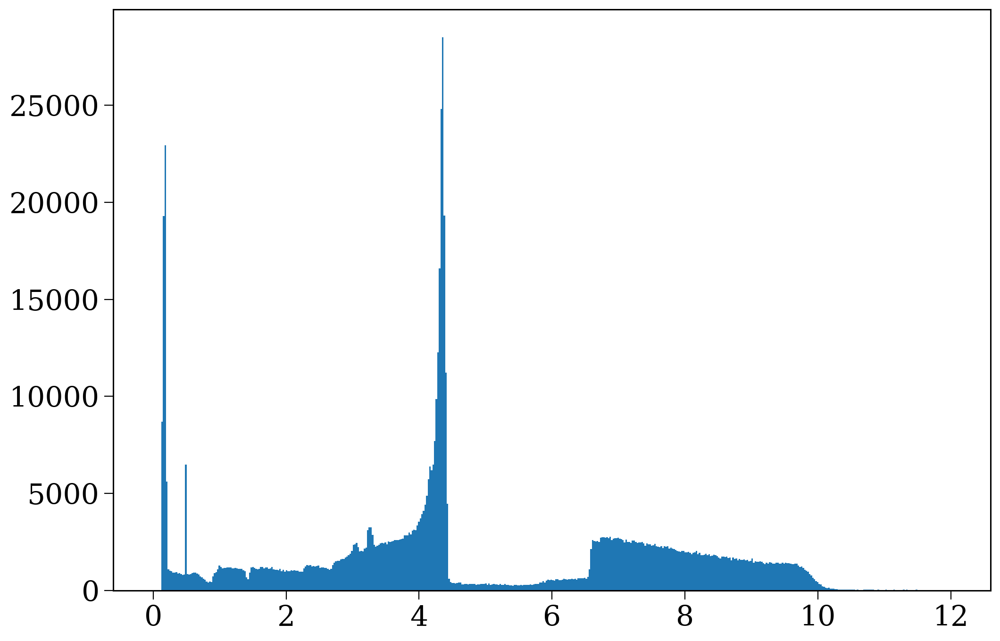

In [189]:
plt.hist(p.bpp["mass_1"].diff(-1).fillna(0.0)[p.bpp["evol_type"] == 15], bins=500, range=(0, 12));
# plt.hist(p.bpp["mass_2"].diff(-1).fillna(0.0)[p.bpp["evol_type"] == 15], bins=500, range=(0, 12));

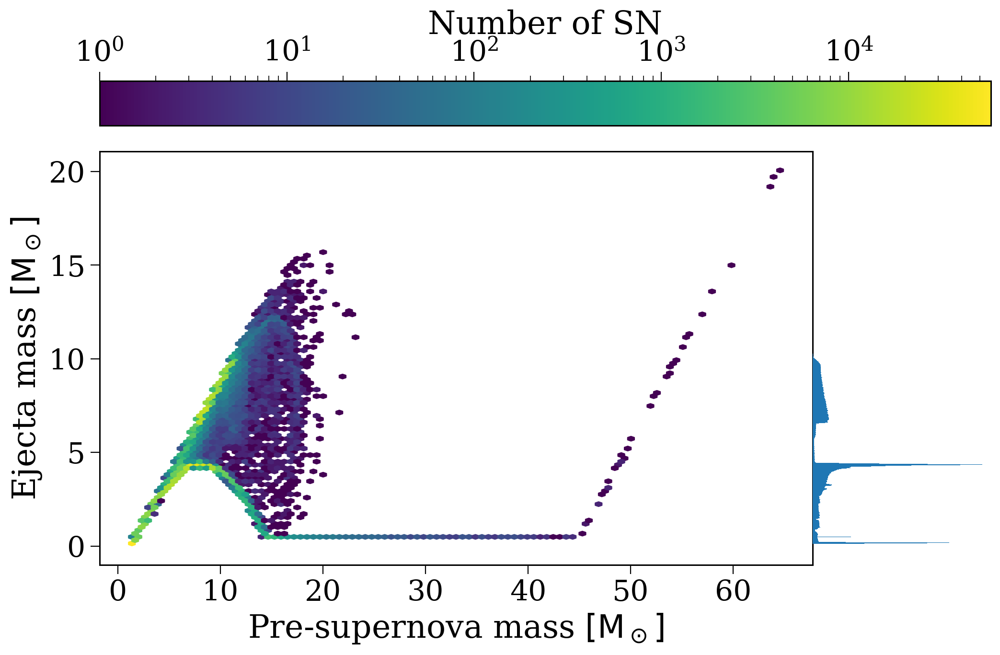

In [218]:
fig, axes = plt.subplots(1, 2, figsize=(12, 7), gridspec_kw={"width_ratios": [12, 3]}, sharey=True)
fig.subplots_adjust(wspace=0.0)

hexbin = axes[0].hexbin(p.bpp["mass_1"][p.bpp["evol_type"] == 15],
                        p.bpp["mass_1"].diff(-1).fillna(0.0)[p.bpp["evol_type"] == 15], bins="log");
fig.colorbar(hexbin, label="Number of SN", ax=axes, orientation="horizontal", location="top")
axes[0].set(xlabel=r"Pre-supernova mass $[\rm M_\odot]$", ylabel=r"Ejecta mass $[\rm M_\odot]$")

axes[1].hist(p.bpp["mass_1"].diff(-1).fillna(0.0)[p.bpp["evol_type"] == 15], bins=500, range=(0, 12), orientation="horizontal");
# axes[1].invert_xaxis()
# axes[1].xaxis.tick_top()

axes[1].axis("off")

# for ax in axes:
#     ax.grid(axis='y')

plt.show()

In [343]:
reload(plotting)
plotting.set_sn_subpop_masks(p);

17068 247674 159305 313495


In [385]:
values = []
for a in [0.0, 0.001, 0.01, 0.05]:
    # a = 0.01
    test = p.bpp["bin_num"][(p.bpp["mass_1"] > p.initC["mass_1"].loc[p.bpp["bin_num"]] * (1 + a)) | (p.bpp["mass_2"] > p.initC["mass_2"].loc[p.bpp["bin_num"]] * (1 + a))].unique()
    values.append(1 - len(test) / (p.initC["kstar_2"] != 15).sum())

In [386]:
for v, a in zip(np.array(values).round(3), [0.0, 0.001, 0.01, 0.05]):
    print(f"Fraction effectively single: {v}, when requiring M - M_ZAMS <= {100 * a}%")

Fraction effectively single: 0.046, when requiring M - M_ZAMS <= 0.0%
Fraction effectively single: 0.088, when requiring M - M_ZAMS <= 0.1%
Fraction effectively single: 0.166, when requiring M - M_ZAMS <= 1.0%
Fraction effectively single: 0.257, when requiring M - M_ZAMS <= 5.0%


0.16624289629469247

In [363]:
1 - len(test) / len(p.bin_nums)

0.583020750328779

In [351]:
rlof_nums = p.bpp[(p.bpp["evol_type"] >= 3) & (p.bpp["evol_type"] <= 8)]["bin_num"].unique()
interaction_nums = np.concatenate((rlof_nums, p.bpp["bin_num"][(p.bpp.groupby("bin_num")["mass_1"].diff().fillna(0.0) > 0.0)
                                              | (p.bpp.groupby("bin_num")["mass_2"].diff().fillna(0.0) > 0.0)].unique()))
1 - (len(interaction_nums) / len(p.bin_nums))

0.089301563238943

0.028087860721711124
0.2527096512498099
0.21294556826468442
0.5062569197637944


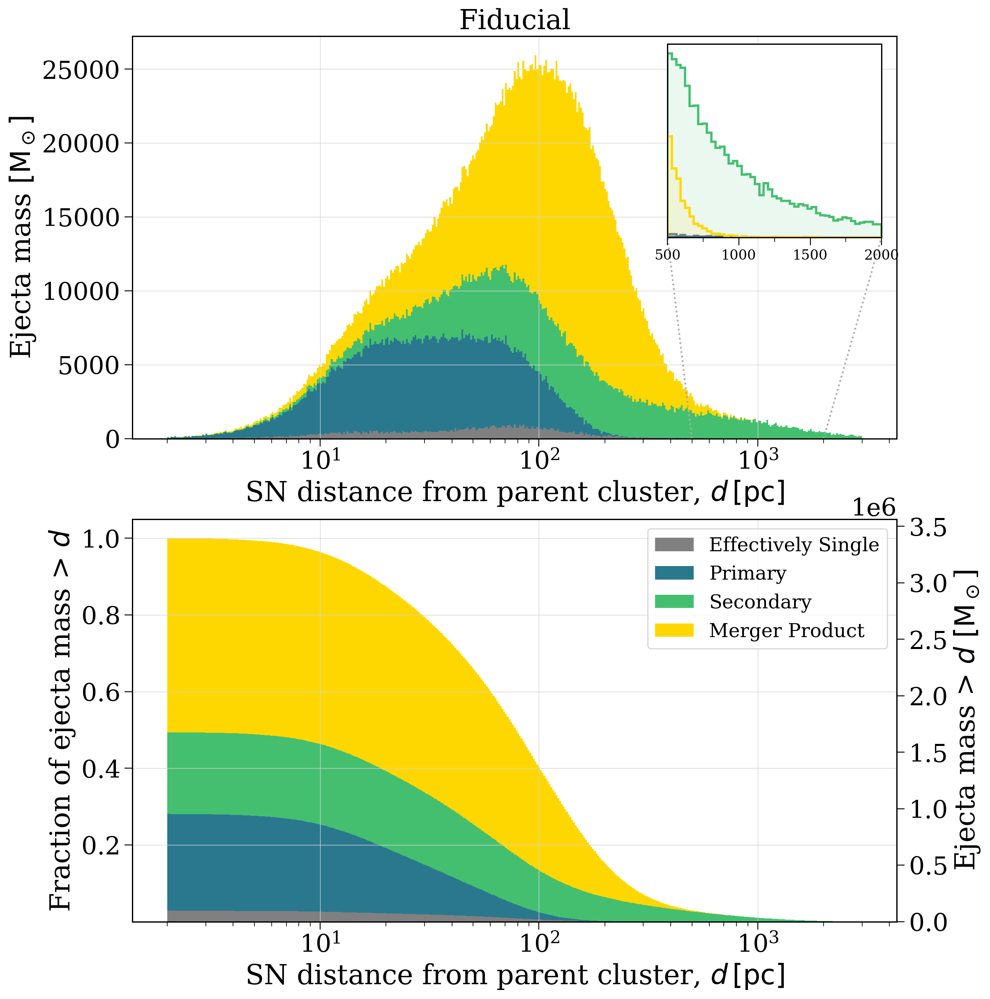

(<Figure size 1200x1400 with 3 Axes>,
 array([<Axes: title={'center': 'Fiducial'}, xlabel='SN distance from parent cluster, $d \\, [\\rm pc]$', ylabel='Ejecta mass $[\\rm M_\\odot]$'>,
        <Axes: xlabel='SN distance from parent cluster, $d \\, [\\rm pc]$', ylabel='Fraction of ejecta mass > $d$'>],
       dtype=object))

In [350]:
reload(plotting)
plotting.ejecta_mass_distance_histograms(p)

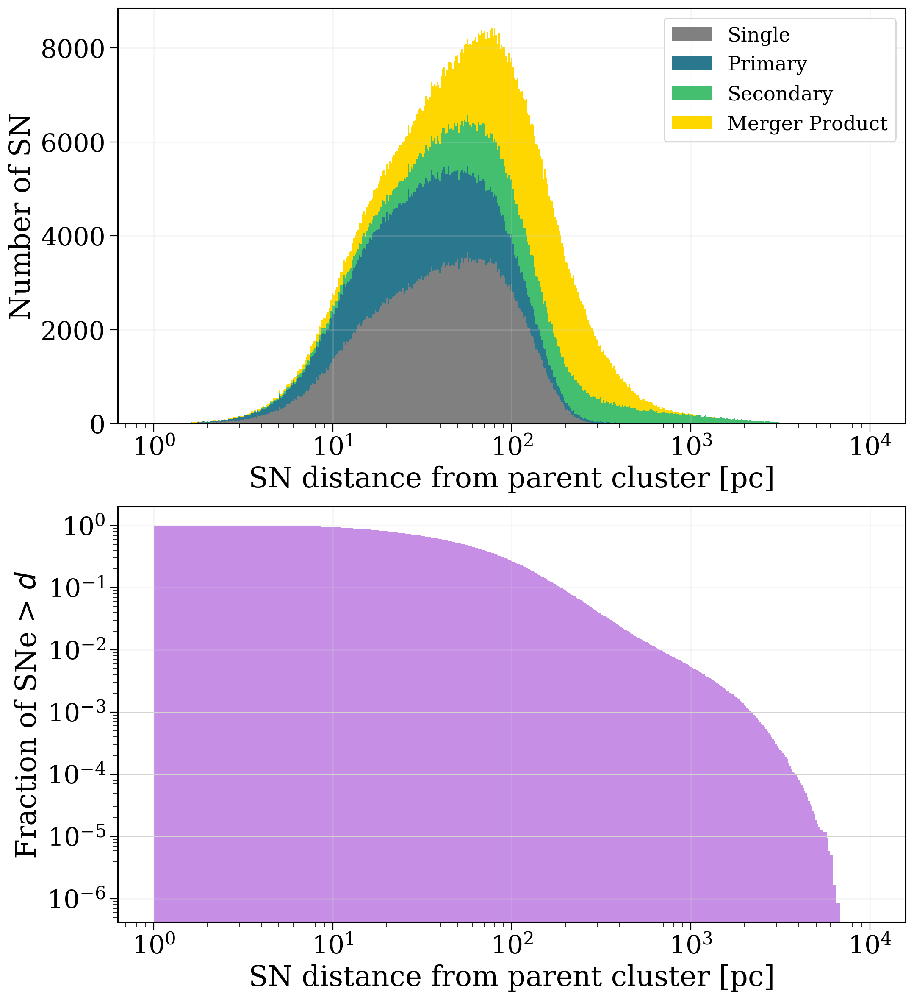

(<Figure size 1200x1400 with 2 Axes>,
 array([<Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Number of SN'>,
        <Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Fraction of SNe > $d$'>],
       dtype=object))

In [100]:
sn_distance_histograms(p)

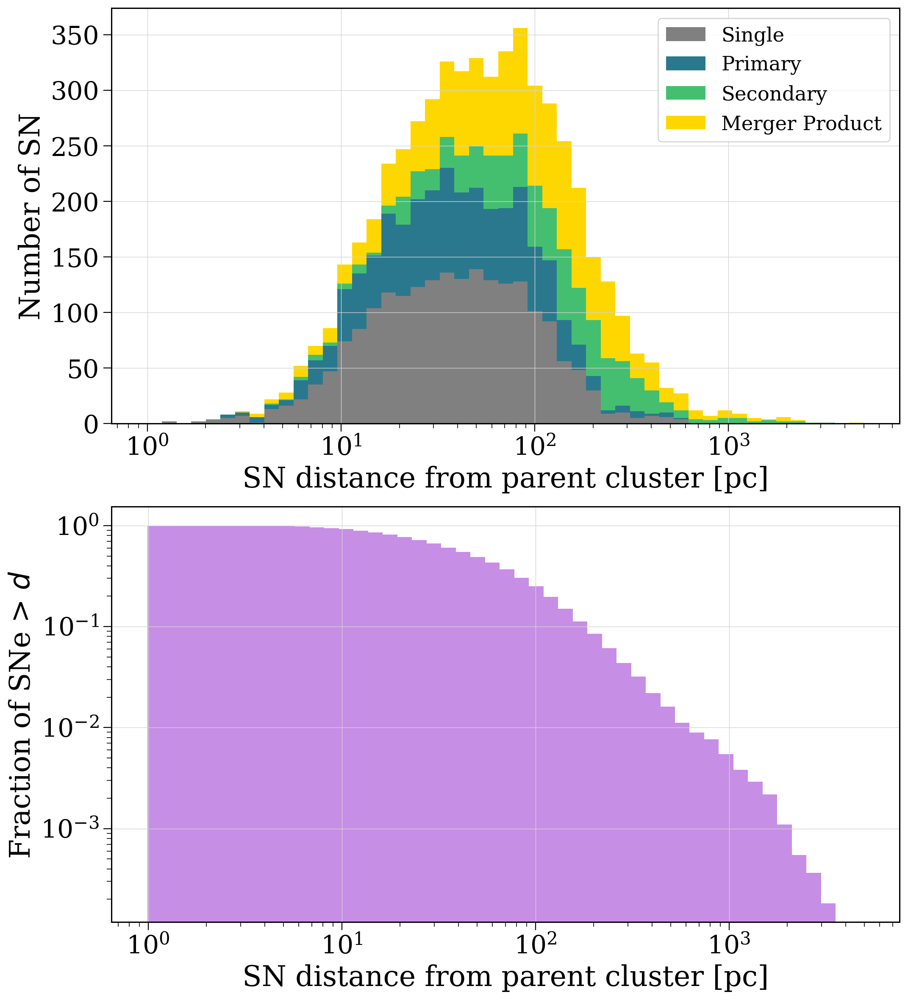

(<Figure size 1200x1400 with 2 Axes>,
 array([<Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Number of SN'>,
        <Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Fraction of SNe > $d$'>],
       dtype=object))

In [99]:
sn_distance_histograms(x, bins=np.geomspace(1e0, 5e3, 50))

In [90]:
x.save("/mnt/home/twagg/ceph/pops/supernovae/TESTING", overwrite=True)

In [10]:
f = np.load(f"/mnt/home/twagg/ceph/pops/supernovae/sn_positions-vir_1.0-ce_1.0.npz")
p.primary_sn_distances, p.secondary_sn_distances = f["arr_0"] * u.kpc, f["arr_1"] * u.kpc

In [15]:
p.avoid_these

array([ 523825, 1776307])

In [22]:
subpop_masks(p);

448402 256442 167605 313495


In [85]:
sn_rows = p.bpp[((p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)) & ~p.bpp["bin_num"].isin(p.avoid_these)]
sn_num_1 = sn_rows[sn_rows["evol_type"] == 15]["bin_num"].values
sn_num_2 = sn_rows[sn_rows["evol_type"] == 16]["bin_num"].values

xsn_rows = x.bpp[((x.bpp["evol_type"] == 15) | (x.bpp["evol_type"] == 16))]
xsn_num_1 = xsn_rows[xsn_rows["evol_type"] == 15]["bin_num"].values
xsn_num_2 = xsn_rows[xsn_rows["evol_type"] == 16]["bin_num"].values

In [80]:
x.bin_nums

array([1053320, 1396580, 1019251, ..., 2144140,  394552,  311128])

In [88]:
x.sn_singles.sum() + x.sn_1.sum() + x.sn_1_merger.sum()

3631

In [97]:
x.primary_sn_distances = p.primary_sn_distances[np.isin(sn_num_1, xsn_num_1)]
x.secondary_sn_distances = p.secondary_sn_distances[np.isin(sn_num_2, xsn_num_2)]

In [94]:
np.savez(f"/mnt/home/twagg/ceph/pops/supernovae/sn_positions-TESTING.npz",
         p.primary_sn_distances[np.isin(sn_num_1, xsn_num_1)].to(u.kpc).value,
         p.secondary_sn_distances[np.isin(sn_num_2, xsn_num_2)].to(u.kpc).value)

In [42]:
x.bin_nums

array([1591698,  840939,  565844, ..., 1485155,  376636,   85250])

In [41]:
np.isin(sn_num_2, x.bin_nums).sum()

1866

In [24]:
p.sn_1.sum()

256442

In [17]:
len(p.primary_sn_distances)

790647

In [11]:
p.primary_sn_distances

<Quantity [0.01405891, 0.2603168 , 0.0186678 , ..., 0.09675557, 0.0717908 ,
           0.02393005] kpc>

In [3]:
%%time
ce_pops = {
    0.1: cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_1.0-ce_0.1"),
    1.0: cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_1.0-ce_1.0"),
    10.0: cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_1.0-ce_10.0"),
}

CPU times: user 42.9 s, sys: 24.6 s, total: 1min 7s
Wall time: 2min 27s


In [4]:
%%time
vir_pops = {
    0.1: cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_0.1-ce_1.0"),
    10.0: cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_10.0-ce_1.0"),
}

CPU times: user 28.4 s, sys: 20.3 s, total: 48.7 s
Wall time: 1min 28s


## Mark any problematic double supernova counts

In [11]:
%%time
uni, counts = np.unique(p.bpp[p.bpp["evol_type"] == 15]["bin_num"], return_counts=True)
x = uni[counts > 1]
uni, counts = np.unique(p.bpp[p.bpp["evol_type"] == 16]["bin_num"], return_counts=True)
y = uni[counts > 1]
p.avoid_these = np.concatenate((x, y))
# ce_pops[ce] = ce_pops[ce][~np.isin(ce_pops[ce].bin_nums, np.concatenate((x, y)))]

CPU times: user 822 ms, sys: 60.2 ms, total: 883 ms
Wall time: 794 ms


In [14]:
%%time
for ce in ce_pops:
    uni, counts = np.unique(ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 15]["bin_num"], return_counts=True)
    x = uni[counts > 1]
    uni, counts = np.unique(ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 16]["bin_num"], return_counts=True)
    y = uni[counts > 1]
    ce_pops[ce].avoid_these = np.concatenate((x, y))
    print(ce, len(x), len(y))
    # ce_pops[ce] = ce_pops[ce][~np.isin(ce_pops[ce].bin_nums, np.concatenate((x, y)))]

1.0 0 2
CPU times: user 771 ms, sys: 102 ms, total: 873 ms
Wall time: 793 ms


In [6]:
%%time
for vir in vir_pops:
    uni, counts = np.unique(vir_pops[vir].bpp[vir_pops[vir].bpp["evol_type"] == 15]["bin_num"], return_counts=True)
    x = uni[counts > 1]
    uni, counts = np.unique(vir_pops[vir].bpp[vir_pops[vir].bpp["evol_type"] == 16]["bin_num"], return_counts=True)
    y = uni[counts > 1]
    vir_pops[vir].avoid_these = np.concatenate((x, y))
    print(vir, len(x), len(y))
    # ce_pops[ce] = ce_pops[ce][~np.isin(ce_pops[ce].bin_nums, np.concatenate((x, y)))]

0.1 0 2
10.0 0 1
CPU times: user 1.59 s, sys: 162 ms, total: 1.75 s
Wall time: 1.55 s


# Supernova times

First let's consider the when since we just need COSMIC for that

In [7]:
import sys
sys.path.append("helpers/")
import tomFIRE

In [8]:
recent_stars = tomFIRE.FIRESnapshot(particle_type="star", min_t_form=13.6 * u.Gyr)

In [9]:
supernova_bin_nums = p.bpp[(p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)]["bin_num"].unique()

NameError: name 'p' is not defined

## Relative to cluster birth

The important time is relative to the cluster birth for comparing with FIRE

In [6]:
def sn_time_histograms(p, bins=np.linspace(0, 300, 500), fig=None, axes=None, show=True):
    if fig is None or axes is None:
        fig, axes = plt.subplots(2, 1, figsize=(12, 14))

    bin_centres = np.array([(bins[i] + bins[i + 1]) / 2. for i in range(len(bins) - 1)])
    widths = np.insert(bin_centres[1:] - bin_centres[:-1], -1, bin_centres[1] - bin_centres[0])

    sn_rows = p.bpp[((p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)) & ~p.bpp["bin_num"].isin(p.avoid_these)]
    sn_initC = p.initC.loc[sn_rows["bin_num"]]
    single_bin_nums = sn_initC[sn_initC["kstar_2"] == 15].index.values
    
    singles_bpp = sn_rows.loc[single_bin_nums]
    bpp = sn_rows.loc[~sn_rows.index.isin(single_bin_nums)] 
    merger_bpp = bpp[bpp["sep"] == 0.0]
    binary_bpp = bpp[bpp["sep"] != 0.0]
    
    times_single = singles_bpp[singles_bpp["evol_type"] == 15]["tphys"]
    times_1 = binary_bpp[binary_bpp["evol_type"] == 15]["tphys"]
    times_merger = merger_bpp[(merger_bpp["evol_type"] == 15) | (merger_bpp["evol_type"] == 16)]["tphys"]
    times_2 = binary_bpp[binary_bpp["evol_type"] == 16]["tphys"]
    
    ax = axes[0]
    ax.hist([times_single, times_1, times_2, times_merger],
            bins=bins, label=["Single", "Primary", "Secondary", "Merger product"], stacked=True,
            color=["grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]);
    ax.legend()
    ax.set_ylabel(ylabel="Number of SN")

    ax = axes[1]
    phist, bins = np.histogram(times_1, bins=bins)
    shist, bins = np.histogram(times_2, bins=bins)
    hist = phist + shist
    ax.bar(bin_centres, 1 - np.cumsum(hist) / np.sum(hist), width=widths, color="#c78ee6")
    ax.set_yscale("log")
    ax.set_ylabel(r"Fraction of SNe after $t$")
    ax.grid(linewidth=0.5, color="lightgrey")

    for ax in axes:
        ax.set(xlabel="Time since cluster birth [Myr]")
        ax.grid(linewidth=0.5, color="lightgrey")

    if show:
        plt.show()
    return fig, axes

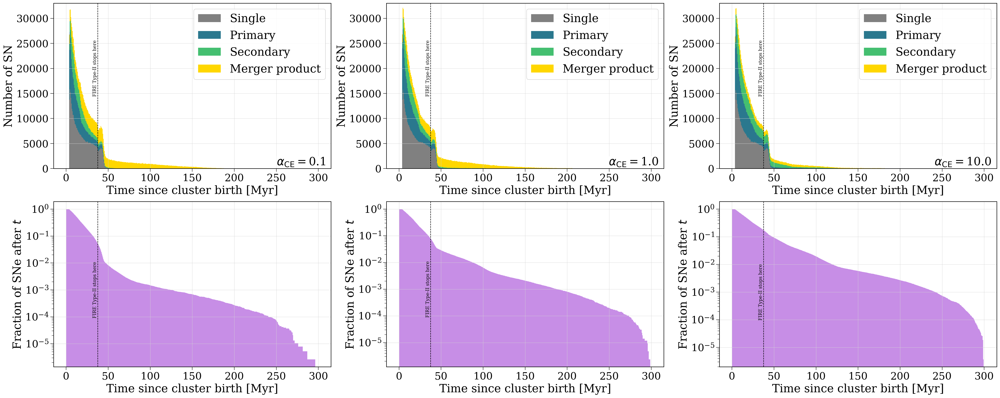

CPU times: user 18.4 s, sys: 2.55 s, total: 20.9 s
Wall time: 19.8 s


In [11]:
%%time
fig, axes = plt.subplots(2, len(ce_pops), figsize=(12 * len(ce_pops), 14))
for i, ce in enumerate(ce_pops):
    sn_time_histograms(ce_pops[ce], fig=fig, axes=axes[:, i], show=False)
    axes[0, i].annotate(r"$\alpha_{\rm CE} = $" + f"{ce}", xy=(0.98, 0.02), xycoords="axes fraction", fontsize=fs, ha="right",
                        bbox=dict(boxstyle="round", ec="white", fc="white", pad=0.0))
    axes[0, i].set_ylim(top=33000)
    
    for j in range(2):
        axes[j, i].axvline(37.53, linestyle="--", color="black", lw=1)
        axes[j, i].annotate("FIRE Type-II stops here", xy=(37, 1e-3 if j == 1 else 20000), rotation=90, color="black", va="center", ha="right")
plt.show()

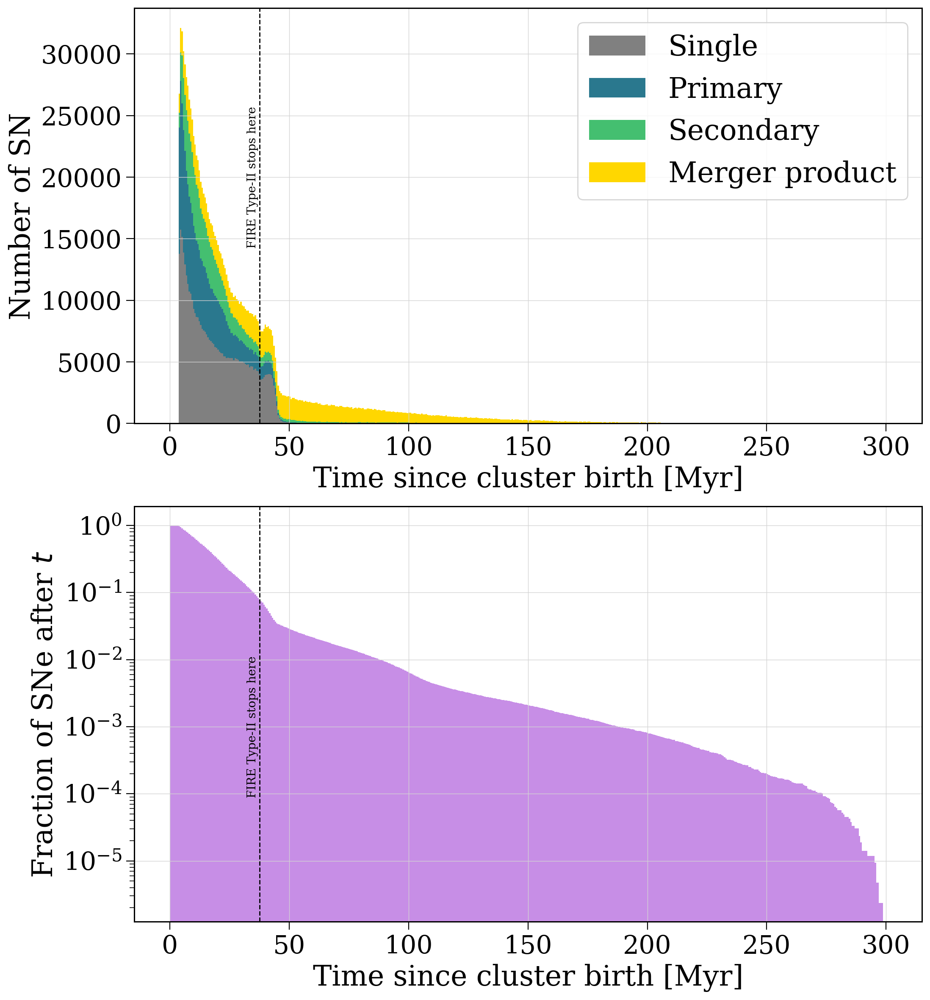

In [12]:
fig, axes = sn_time_histograms(p, show=False)
for ax in axes:
    ax.axvline(37.53, linestyle="--", color="black", lw=1)
    ax.annotate("FIRE-2 Type-II stops here", xy=(37, 1e-3 if ax == axes[1] else 20000), rotation=90, color="black", va="center", ha="right")
plt.show()

0.023145655714473627
0.3358154205829266
0.216031092312762
0.4250078313898378


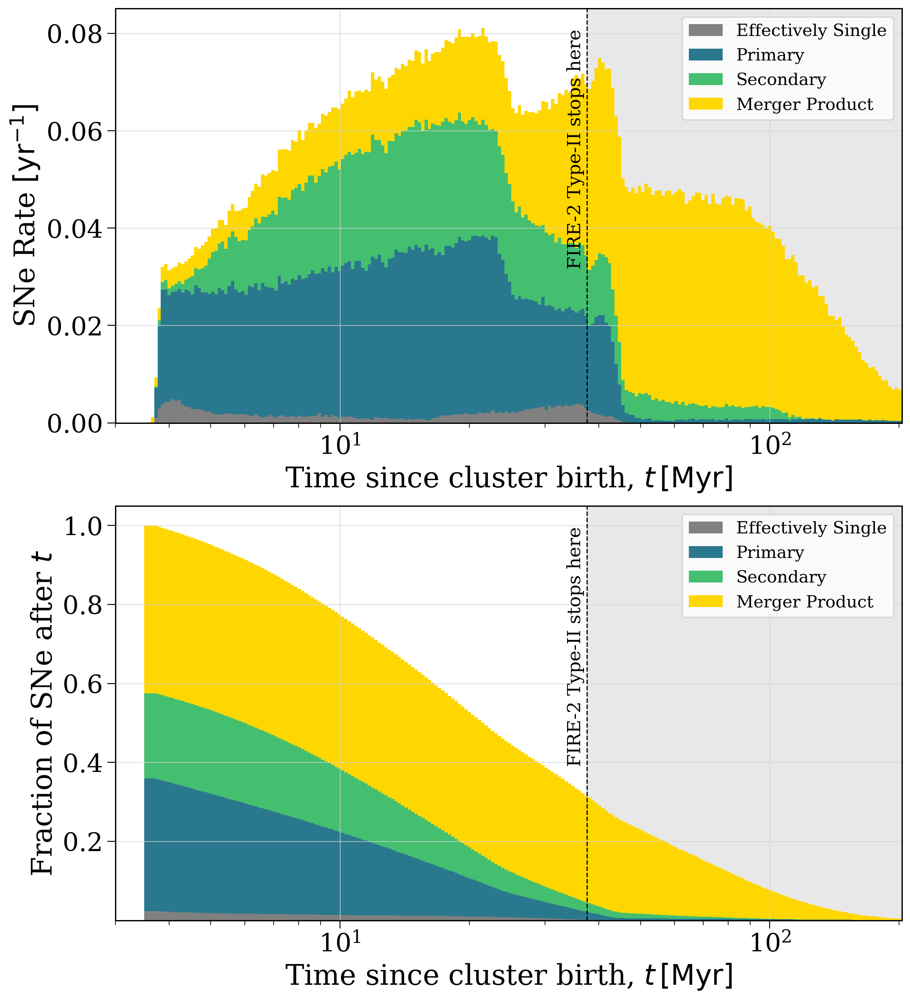

In [11]:
reload(plotting)
fig, axes = plotting.sn_time_histograms(p, bins=np.geomspace(3.5, 300, 250), log=True)

## Relative to fixed time

It's also interesting to see how the supernova rate changes over the evolution of the galaxy

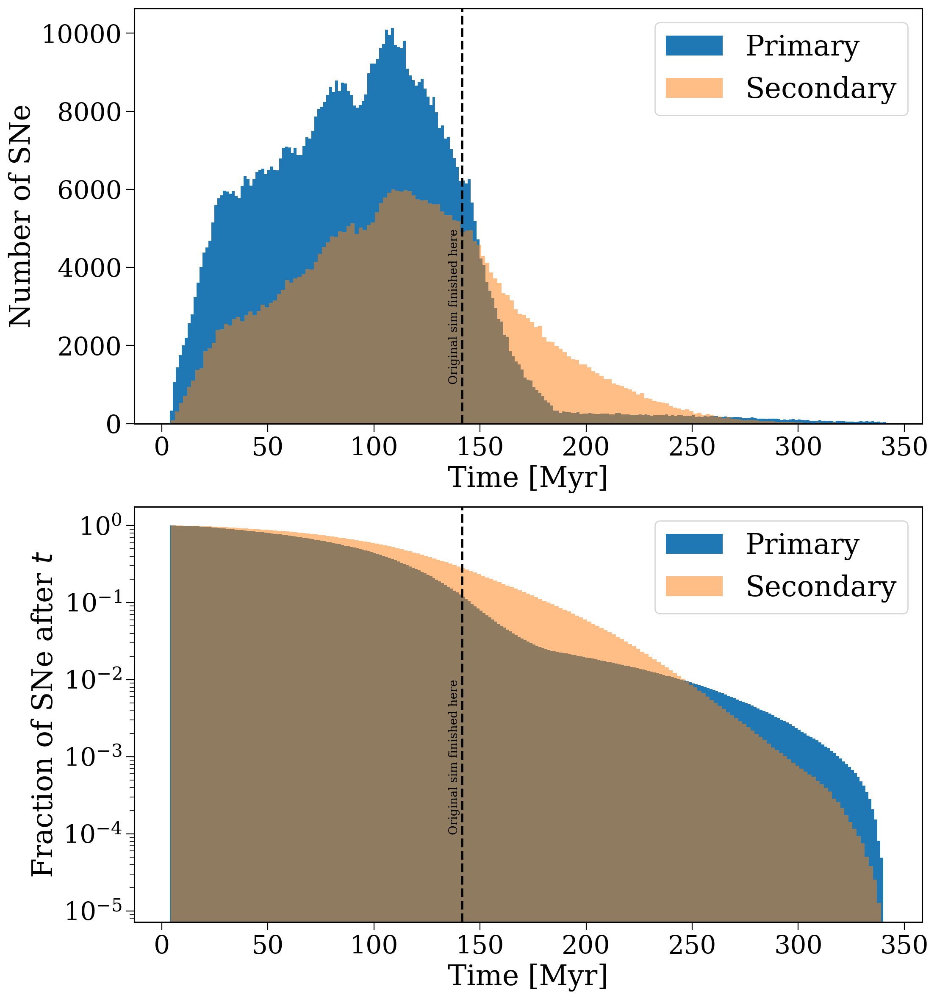

In [40]:
fig, axes = plt.subplots(2, 1, figsize=(12, 14))

offset_to_zero = (p.max_ev_time - 13.6 * u.Gyr - p.initial_galaxy.tau).to(u.Myr).value

x = 0

for ax, cumulative in zip(axes, [False, True]):
    for sn, alpha, label in zip([15, 16], [1, 0.5], ["Primary", "Secondary"]):
        bin_nums_sn = p.bpp[p.bpp["evol_type"] == sn]["bin_num"].values
        if cumulative:
            hist, bins = np.histogram(p.bpp[p.bpp["evol_type"] == sn]["tphys"] + offset_to_zero[np.isin(p.bin_nums, bin_nums_sn)],
                                      bins="fd", density=False)
            bin_centres = [(bins[i]+bins[i+1])/2. for i in range(len(bins)-1)]
            ax.bar(bin_centres, 1 - np.cumsum(hist) / np.sum(hist), width=bin_centres[1] - bin_centres[0], alpha=alpha, label=label)
            ax.set_yscale("log")
            ax.set_ylabel(r"Fraction of SNe after $t$")
        else:
            times = p.bpp[p.bpp["evol_type"] == sn]["tphys"] + offset_to_zero[np.isin(p.bin_nums, bin_nums_sn)]
            x += len(times[times < 141])
            ax.hist(p.bpp[p.bpp["evol_type"] == sn]["tphys"] + offset_to_zero[np.isin(p.bin_nums, bin_nums_sn)],
                    bins="fd", alpha=alpha, label=label);
            ax.set_ylabel("Number of SNe")
    
    sim_time = (p.max_ev_time - 13.6 * u.Gyr - 200 * u.Myr).to(u.Myr).value
    ax.axvline(sim_time, linestyle="--", color="black", lw=2)
    ax.annotate("Original sim finished here", xy=(sim_time - 1, 1e-3 if cumulative else 3000),
                rotation=90, color="black", va="center", ha="right")
    
    ax.set_xlabel("Time [Myr]")
    ax.legend()


plt.show()

# Supernova locations

Okay now let's look at where these supernovae actually go off

## Prep star particles

In [13]:
%%time
star_particles = pd.read_hdf("FIRE_star_particles.h5")
try:
    particle_orbits = np.load("particle_orbits.npy", allow_pickle=True)
except:
    particle_orbits = [None for _ in range(len(star_particles))]
    for i in range(len(star_particles)):
        if i % 1000 == 0:
            print(i)
        w0 = gd.PhaseSpacePosition(pos=star_particles.iloc[i][["x", "y", "z"]].values * u.kpc,
                                vel=star_particles.iloc[i][["v_x", "v_y", "v_z"]].values * u.km / u.s)
        min_dt = (p.max_ev_time - star_particles.iloc[i]["t_form"] * u.Gyr).to(u.Myr).value
        if min_dt <= 0.01:
            continue
        particle_orbits[i] = p.galactic_potential.integrate_orbit(w0,
                                                                  t1=star_particles.iloc[i]["t_form"] * u.Gyr,
                                                                  t2=p.max_ev_time,
                                                                  dt=min(min_dt - 0.01, 1) * u.Myr)
    np.save("particle_orbits.npy", particle_orbits)

CPU times: user 1.36 s, sys: 109 ms, total: 1.47 s
Wall time: 1.48 s


## Attach distances and masks

In [14]:
for ce in ce_pops:
    f = np.load(f"/mnt/home/twagg/ceph/pops/supernovae/sn_positions-vir_1.0-ce_{ce}.npz")
    ce_pops[ce].primary_sn_distances, ce_pops[ce].secondary_sn_distances = f["arr_0"] * u.kpc, f["arr_1"] * u.kpc

In [15]:
for vir in vir_pops:
    f = np.load(f"/mnt/home/twagg/ceph/pops/supernovae/sn_positions-vir_{vir}-ce_{1.0}.npz")
    vir_pops[vir].primary_sn_distances, vir_pops[vir].secondary_sn_distances = f["arr_0"] * u.kpc, f["arr_1"] * u.kpc

In [20]:
def subpop_masks(p):
    sn_rows = p.bpp[((p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)) & ~p.bpp["bin_num"].isin(p.avoid_these)]
    sn_initC = p.initC.loc[sn_rows["bin_num"]]
    single_bin_nums = sn_initC[sn_initC["kstar_2"] == 15].index.values
    
    primary_sn_rows = sn_rows[sn_rows["evol_type"] == 15]
    secondary_sn_rows = sn_rows[sn_rows["evol_type"] == 16]

    p.sn_singles = primary_sn_rows["bin_num"].isin(single_bin_nums)
    
    sn_1_sep_zero = primary_sn_rows["bin_num"].isin(primary_sn_rows["bin_num"][primary_sn_rows["sep"] == 0.0])
    p.sn_1_merger = ~p.sn_singles & sn_1_sep_zero
    p.sn_1 = ~p.sn_singles & ~sn_1_sep_zero
    
    sn_2_sep_zero = secondary_sn_rows["bin_num"].isin(secondary_sn_rows["bin_num"][secondary_sn_rows["sep"] == 0.0])
    p.sn_2_merger = sn_2_sep_zero
    p.sn_2 = ~sn_2_sep_zero
    
    print(p.sn_singles.sum(), p.sn_1.sum(), p.sn_2.sum(), p.sn_1_merger.sum() + p.sn_2_merger.sum())
    
    return p.sn_singles, p.sn_1, p.sn_1_merger, p.sn_2, p.sn_2_merger

In [17]:
for ce in ce_pops:
    subpop_masks(ce_pops[ce])

449074 227559 152583 373135
448402 256442 167605 313495
448578 289083 248782 146392


In [18]:
for vir in vir_pops:
    subpop_masks(vir_pops[vir])

449033 255468 168021 314200
449297 256462 168441 314487


## Fiducial simulation

In [95]:
def sn_distance_histograms(p, bins=np.geomspace(1e0, 1e4, 500), fig=None, axes=None, show=True):
    if fig is None or axes is None:
        fig, axes = plt.subplots(2, 1, figsize=(12, 14))

    bin_centres = np.array([(bins[i] + bins[i + 1]) / 2. for i in range(len(bins) - 1)])
    widths = np.insert(bin_centres[1:] - bin_centres[:-1], -1, bin_centres[1] - bin_centres[0])

    ax = axes[0]
    ax.hist([p.primary_sn_distances.to(u.pc).value[p.sn_singles],
             p.primary_sn_distances.to(u.pc).value[p.sn_1],
             p.secondary_sn_distances.to(u.pc).value[p.sn_2],
             np.concatenate((p.primary_sn_distances.to(u.pc).value[p.sn_1_merger], p.secondary_sn_distances.to(u.pc).value[p.sn_2_merger]))],
            bins=bins, label=["Single", "Primary", "Secondary", "Merger Product"], stacked=True,
            color=["grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]);
    ax.legend(fontsize=0.7*fs)
    ax.set_ylabel(ylabel="Number of SN")

    ax = axes[1]
    phist, bins = np.histogram(p.primary_sn_distances.to(u.pc).value, bins=bins)
    shist, bins = np.histogram(p.secondary_sn_distances.to(u.pc).value, bins=bins)
    hist = phist + shist
    ax.bar(bin_centres, 1 - np.cumsum(hist) / np.sum(hist), width=widths, color="#c78ee6")
    ax.set_yscale("log")
    ax.set_ylabel(r"Fraction of SNe > $d$")

    for ax in axes:
        ax.set(xscale="log", xlabel="SN distance from parent cluster [pc]")
        ax.grid(linewidth=0.5, color="lightgrey")

    if show:
        plt.show()
    return fig, axes

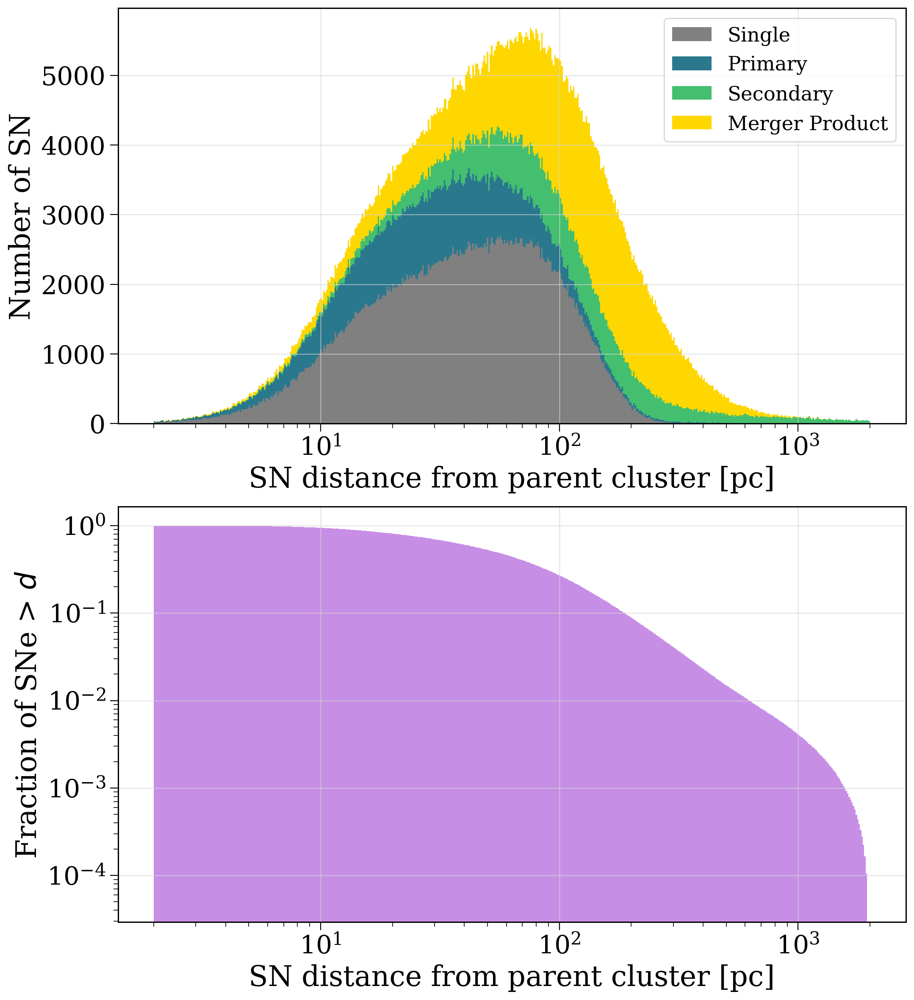

(<Figure size 1200x1400 with 2 Axes>,
 array([<Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Number of SN'>,
        <Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Fraction of SNe > $d$'>],
       dtype=object))

In [130]:
sn_distance_histograms(ce_pops[1.0], bins=np.geomspace(2e0, 2e3, 500))

## CE Variations

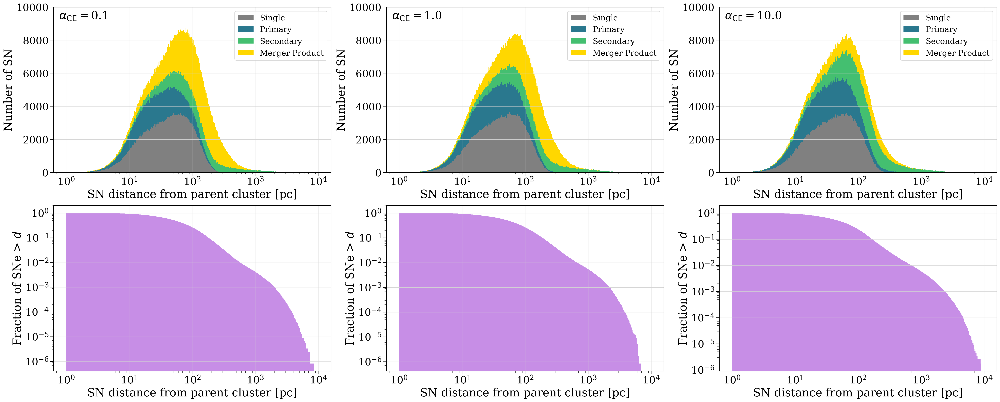

CPU times: user 13.4 s, sys: 163 ms, total: 13.5 s
Wall time: 13.3 s


In [23]:
%%time
fig, axes = plt.subplots(2, len(ce_pops), figsize=(12 * len(ce_pops), 14))
for i, ce in enumerate(ce_pops):
    sn_distance_histograms(ce_pops[ce], bins=np.geomspace(1e0, 1e4, 500), fig=fig, axes=axes[:, i], show=False)
    axes[0, i].annotate(r"$\alpha_{\rm CE} = $" + f"{ce}", xy=(0.02, 0.98), xycoords="axes fraction", fontsize=fs, va="top",
                        bbox=dict(boxstyle="round", ec="white", fc="white", pad=0.0))
    axes[0, i].set_ylim(top=10000)
plt.show()

### Why CE variations the same?

In [24]:
def ce_sn_2_fraction(p):
    # get every supernova 2 row from bpp
    sn_2_rows= p.bpp[(p.bpp["evol_type"] == 16) & ~np.isin(p.bpp["bin_num"], p.avoid_these)][p.sn_2]
    
    # all bpp rows that have an SN2
    sn_2_bpp = p.bpp.loc[sn_2_rows["bin_num"]]
    
    # find the common envelope initiation
    sn_2_ces = sn_2_bpp[sn_2_bpp["evol_type"] == 7]["bin_num"].unique()
    sn_2_ces_from_1 = sn_2_bpp[(sn_2_bpp["evol_type"] == 7) & (sn_2_bpp["RRLO_1"] > 1)]["bin_num"].unique()
    
    # grab corresponding SN1 eccentricities
#     sn_1_rows = sn_2_bpp[sn_2_bpp["evol_type"] == 15]
#     ecc = np.ones(len(sn_2_rows)) * 0
#     ecc[np.isin(sn_2_rows["bin_num"], sn_1_rows["bin_num"])] = sn_1_rows["ecc"]
    
    plt.hist(p.initC.loc[sn_2_rows["bin_num"]]["mass_2"] / p.initC.loc[sn_2_rows["bin_num"]]["mass_1"], bins="fd")
    plt.show()
    
#     scatter = plt.scatter(p.initC.loc[sn_2_rows["bin_num"]]["mass_2"] - sn_2_rows["mass_2"], sn_2_rows["mass_2"], c=ecc, s=1, vmin=0.0)
#     plt.colorbar(scatter)
#     plt.xlabel("(m2_init - m2_preSN)")
#     plt.axhline(1.38, color="grey")
#     plt.show()
    
    return len(sn_2_ces) / len(sn_2_rows), len(sn_2_ces_from_1) / len(sn_2_rows)

CE alpha | Fraction of SN2 with >=1 CE | Fraction of SN2 with >=1 CE from primary | Fraction of CE from primary | Number of SN2 | Number of SN Merger


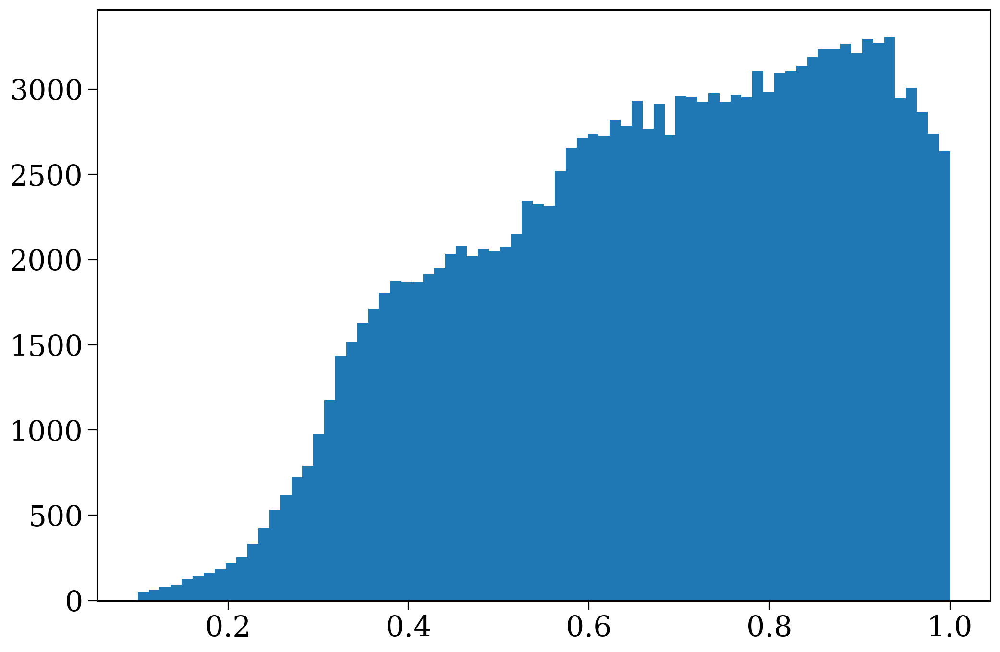

0.1 0.012 0.008 0.642 152583 373135


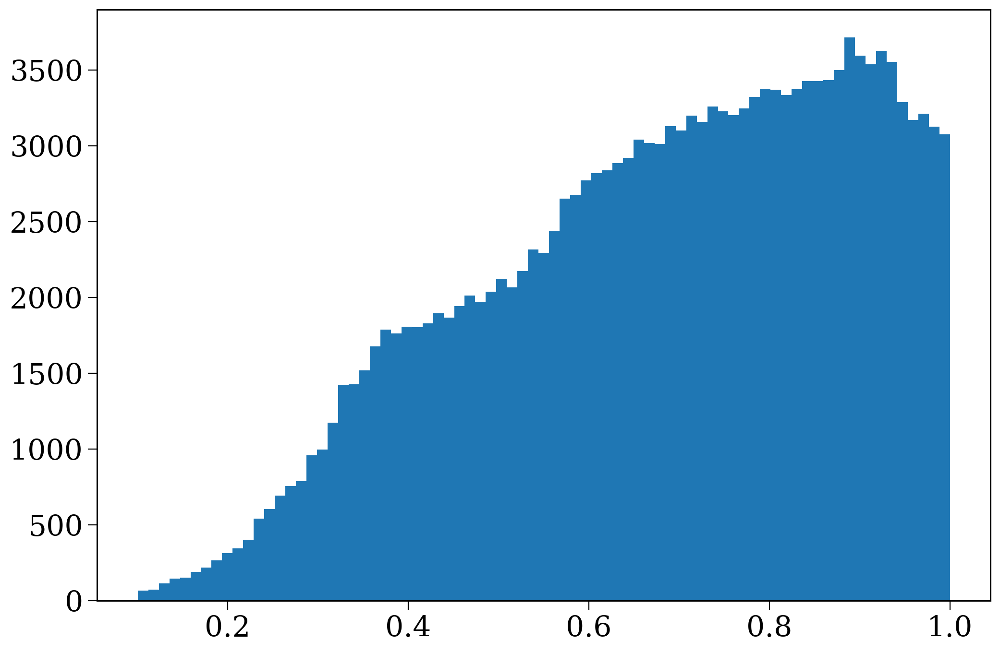

1.0 0.101 0.048 0.475 167605 313495


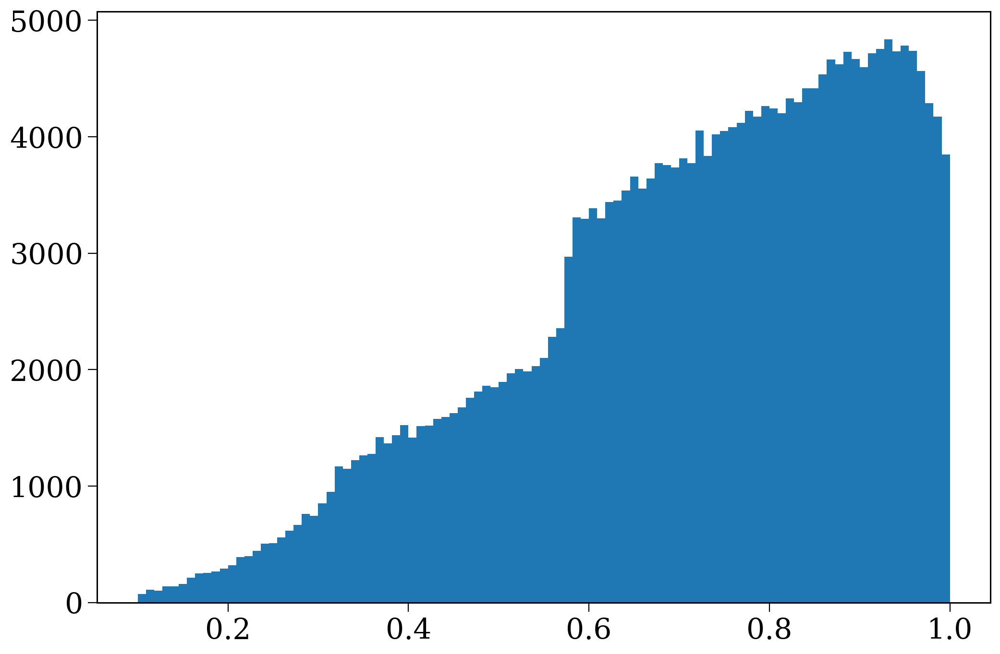

10.0 0.394 0.063 0.160 248782 146392


In [25]:
print("CE alpha | Fraction of SN2 with >=1 CE | Fraction of SN2 with >=1 CE from primary | Fraction of CE from primary | Number of SN2 | Number of SN Merger")
for ce in ce_pops:
    fs_thing = ce_sn_2_fraction(ce_pops[ce])
    print(ce, f'{fs_thing[0]:1.3f}', f'{fs_thing[1]:1.3f}', f'{fs_thing[1] / fs_thing[0]:1.3f}', ce_pops[ce].sn_2.sum(), ce_pops[ce].sn_1_merger.sum() + ce_pops[ce].sn_2_merger.sum())
    # break

[Text(0.5, 0, 'Common-envelope efficiency, $\\alpha_{\\rm CE}$'),
 Text(0, 0.5, 'Relative # merger product SNe')]

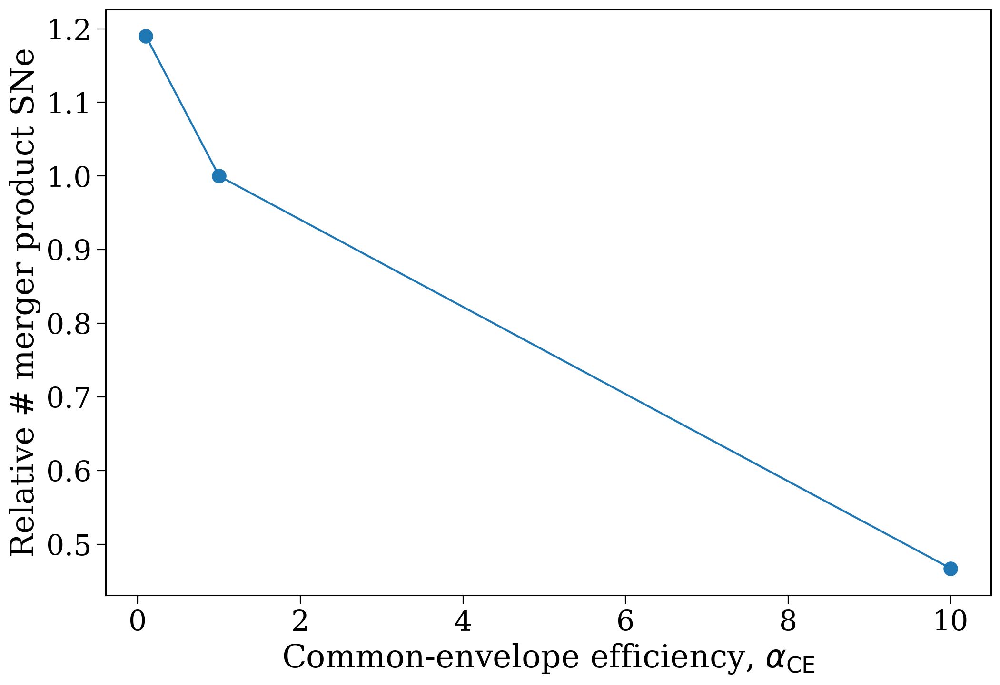

In [27]:
n_mergers = [ce_pops[ce].sn_1_merger.sum() + ce_pops[ce].sn_2_merger.sum() for ce in ce_pops]
fig, ax = plt.subplots()
ax.plot([ce for ce in ce_pops], n_mergers / n_mergers[1], marker="o", markersize=10)
ax.set(xlabel=r"Common-envelope efficiency, $\alpha_{\rm CE}$", ylabel="Relative # merger product SNe")

23.859850154374445 5.62556617964665
1851
0.9391220407646538
11.221798307208717
24.911990388376765 5.8878279966806355
16972
0.55674912623403
28.374775874441
26.659476321895802 5.853451891209912
97913
0.1013216521478915
97.2796851021859


TypeError: can't multiply sequence by non-int of type 'float'

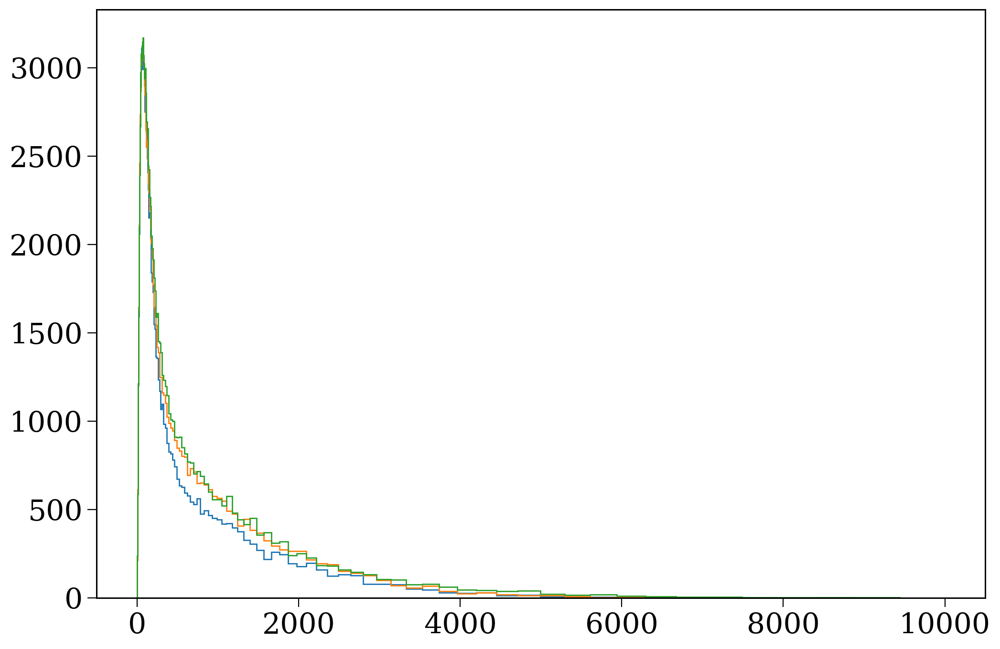

In [28]:
%%time
for ce in ce_pops:
    ce_happened = ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 7]["bin_num"]
    sn_2 = ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 16]["bin_num"].unique()
    
    sn_2 = ce_pops[ce].bin_nums[np.isin(ce_pops[ce].bin_nums, sn_2) & ~np.isin(ce_pops[ce].bin_nums, ce_pops[ce].avoid_these)][ce_pops[ce].sn_2]
    
    sn_both = ce_pops[ce].bpp.loc[sn_2][ce_pops[ce].bpp.loc[sn_2]["evol_type"] == 15]["bin_num"]
    
    sn_both_rows = ce_pops[ce].bpp.loc[sn_both]
    t_SN_1 = sn_both_rows[sn_both_rows["evol_type"] == 15]["tphys"]
    t_SN_2 = sn_both_rows[sn_both_rows["evol_type"] == 16]["tphys"]
    t_between_SN = (t_SN_2 - t_SN_1).values
    
    v = ce_pops[ce].kick_info.loc[sn_both].drop_duplicates(subset="bin_num", keep="first")["vsys_2_total"].values
    
    print(np.mean(v), np.mean(t_between_SN))
    
    weirdos = sn_both_rows["bin_num"].unique()[t_between_SN < 0]
    print
    
    dist_guess = (v * u.km / u.s * t_between_SN * u.Myr).to(u.pc).value
    plt.hist(dist_guess[dist_guess > 0.0], bins=np.geomspace(1e-1, 1e4, 200), histtype="step", label=ce)
    
    # break
    
    print((np.isin(ce_pops[ce].bin_nums, ce_happened) & np.isin(ce_pops[ce].bin_nums, sn_2)).sum())
    
    post_ce_seps = ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 8]["sep"]
    print((post_ce_seps == 0).sum() / len(post_ce_seps))
    print(np.mean(post_ce_seps[post_ce_seps > 0]))


leg = plt.legend(title=r"$\alpha_{\rm CE}$", fontsize=0.7*fs)
leg.get_title().set_fontsize(0.8*fs)
plt.xscale("log")
plt.xlabel(r"$v_{2, {\rm post-SN1}} \cdot (t_{\rm SN2} - t_{\rm SN1}) \, [\rm pc]$")
plt.ylabel("Number of SNe")
plt.show()

## Virial parameter variations

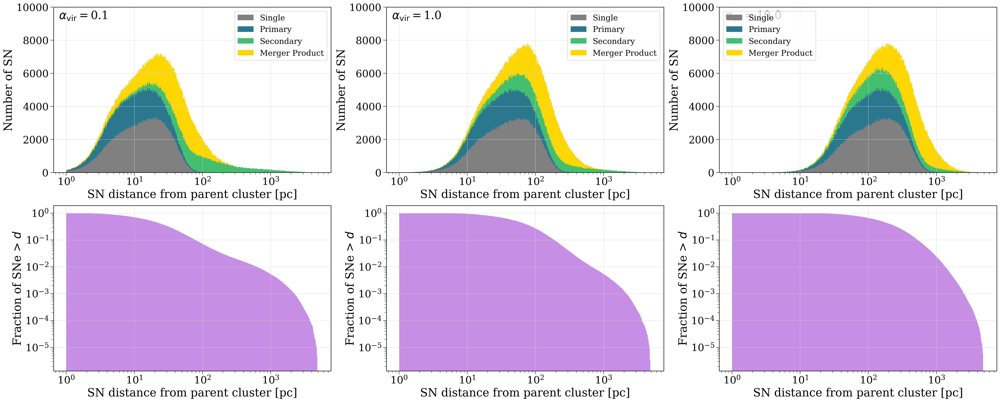

CPU times: user 13.3 s, sys: 189 ms, total: 13.5 s
Wall time: 13.3 s


In [31]:
%%time
fig, axes = plt.subplots(2, 3, figsize=(12 * 3, 14))
i = 0
for p, vir in zip([vir_pops[0.1], ce_pops[1.0], vir_pops[10.0]], [0.1, 1.0, 10.0]):
    sn_distance_histograms(p, bins=np.geomspace(1e0, 5e3, 500), fig=fig, axes=axes[:, i], show=False)
    axes[0, i].annotate(r"$\alpha_{\rm vir} = $" + f"{vir}", xy=(0.02, 0.98), xycoords="axes fraction", fontsize=fs, va="top",
                        bbox=dict(boxstyle="round", ec="white", fc="white", pad=0.0))
    axes[0, i].set_ylim(top=10000)
    i += 1
plt.show()

### Old mass bin things

In [ ]:
sn_distances_hists = [sn_distances[(p.initC.loc[kicked_bin_nums]["mass_1"].values <= 15)], sn_distances[(p.initC.loc[kicked_bin_nums]["mass_1"].values > 15)]]

16265
11154
10571
5873
4377


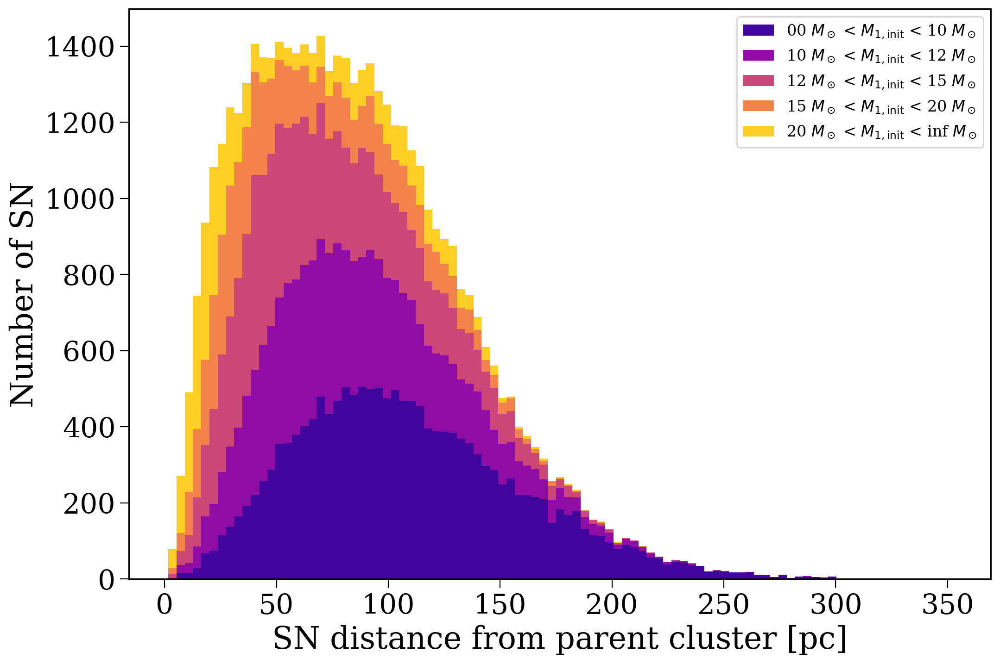

In [ ]:
mass_ranges = [(0, 10), (10, 12), (12, 15), (15, 20), (20, np.inf)]
mass_1_kicked = p.initC.loc[kicked_bin_nums]["mass_1"].values
sn_distances_hists = [sn_distances[(mass_1_kicked >= m_low) & (mass_1_kicked < m_high)].to(u.pc) for m_low, m_high in mass_ranges]

for x in sn_distances_hists:
    print(len(x))

labels = [f"{m_low:02d} $M_\odot$ < $M_{{1, \\rm init}}$ < {m_high} $M_\odot$" for m_low, m_high in mass_ranges]

plt.hist(sn_distances_hists, stacked=True, bins="fd", label=labels,
         color=plt.cm.plasma(np.linspace(0.1, 0.9, len(mass_ranges))));
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Number of SN")
plt.legend(fontsize=0.5*fs)
plt.show()

## Time animations

In [274]:
from matplotlib import animation

In [326]:
plt.rcParams["animation.html"] = "jshtml"

In [201]:
def sn_distance_histograms(p, bins=np.geomspace(1e0, 1e4, 500), fig=None, axes=None, show=True):
    if fig is None or axes is None:
        fig, axes = plt.subplots(2, 1, figsize=(12, 14))

    bin_centres = np.array([(bins[i] + bins[i + 1]) / 2. for i in range(len(bins) - 1)])
    widths = np.insert(bin_centres[1:] - bin_centres[:-1], -1, bin_centres[1] - bin_centres[0])

    ax = axes[0]
    ax.hist([p.primary_sn_distances.to(u.pc).value[p.sn_singles],
             p.primary_sn_distances.to(u.pc).value[p.sn_1],
             p.secondary_sn_distances.to(u.pc).value[p.sn_2],
             np.concatenate((p.primary_sn_distances.to(u.pc).value[p.sn_1_merger], p.secondary_sn_distances.to(u.pc).value[p.sn_2_merger]))],
            bins=bins, label=["Single", "Primary", "Secondary", "Merger Product"], stacked=True,
            color=["grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]);
    ax.legend(fontsize=0.7*fs)
    ax.set_ylabel(ylabel="Number of SN")

    ax = axes[1]
    phist, bins = np.histogram(p.primary_sn_distances.to(u.pc).value, bins=bins)
    shist, bins = np.histogram(p.secondary_sn_distances.to(u.pc).value, bins=bins)
    hist = phist + shist
    ax.bar(bin_centres, 1 - np.cumsum(hist) / np.sum(hist), width=widths, color="#c78ee6")
    ax.set_yscale("log")
    ax.set_ylabel(r"Fraction of SNe > $d$")

    for ax in axes:
        ax.set(xscale="log", xlabel="SN distance from parent cluster [pc]")
        ax.grid(linewidth=0.5, color="lightgrey")

    if show:
        plt.show()
    return fig, axes

In [338]:
frames

array([  0,  50, 100, 150, 200, 250, 300])

In [328]:
x = [1, 2, 3]
x[:2]

[1, 2]

In [342]:
np.concatenate((np.arange(0, 40 + 5, 5), np.arange(45, 200, 20)))

array([  0,   5,  10,  15,  20,  25,  30,  35,  40,  45,  65,  85, 105,
       125, 145, 165, 185])

14129

In [370]:
(100.10604 * u.pc / (4.664514 * u.Myr)).to(u.km / u.s)

<Quantity 20.98458859 km / s>

In [369]:
p.primary_sn_distances[((p.primary_sn_distances > 100 * u.pc) & (sn_times_1 < 5))].to(u.pc)

<Quantity [100.10603734, 111.11651798, 113.85087414, ..., 116.9777569 ,
           116.17156442, 124.859594  ] pc>

In [375]:
p.initial_galaxy

<Galaxy, size=2165527>

In [ ]:
p.orbits

In [363]:
p.bpp.loc[92]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
92,0.000000,56.823164,33.827069,1.0,1.0,11354.390976,14727.650381,0.468619,0.004606,0.004154,1.0,0.000000,0.000000,3.948477e+00,5.273949e+00,0.000000,0.000000,11.796193,8.396131,56.823164,33.827069,4.612814e+05,1.570882e+05,43993.666403,39835.099373,0.000000,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,8.565952e+02,1.225780e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,92
92,4.120487,43.742501,31.754131,2.0,1.0,13634.253051,21235.153109,0.468619,0.012764,0.006171,2.0,4.475150,4.234185,4.475150e+00,5.530910e+00,15.797396,0.000000,37.629542,15.717139,43.742501,31.754131,6.594975e+05,2.459724e+05,26934.469411,32569.001112,1.239652,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.660670e+01,2.123721e+02,0.0,0.0,0.0,0.0,0.0,0.0,-0.354663,-0.113698,0.0,0.0,92
92,4.125613,43.185806,31.757529,4.0,1.0,13727.229456,21531.782878,0.468516,0.647874,0.006120,2.0,4.480276,4.238959,4.475150e+00,5.530450e+00,16.113319,0.000000,1918.070065,15.744266,43.742501,31.757529,6.309748e+05,2.462575e+05,3731.129996,32550.356431,1.254718,0.000000,1.840798e+01,1.000000e-10,1.740603e+03,1.000000e-10,4.254227e-03,2.115775e+02,0.0,0.0,0.0,0.0,0.0,0.0,-0.354663,-0.113346,0.0,0.0,92
92,4.297169,17.478669,34.978500,7.0,1.0,13124.032066,24058.616877,0.319901,0.000481,0.004628,2.0,0.162096,4.110674,4.579490e-01,5.148976e+00,0.000000,0.000000,1.377271,18.176731,17.478669,34.978500,4.484255e+05,3.135144e+05,127844.632507,32179.262514,0.000000,0.000000,1.747867e+01,1.000000e-10,1.377271e+00,1.000000e-10,3.220455e-07,1.397997e+03,0.0,0.0,0.0,0.0,0.0,0.0,4.135072,0.186495,0.0,0.0,92
92,4.640503,10.856719,34.660488,8.0,1.0,15127.124122,31960.893704,0.319901,0.000337,0.004290,2.0,0.610809,4.481755,6.108083e-01,5.182360e+00,7.505747,0.000000,0.985296,21.254597,10.856719,34.660488,2.357219e+05,3.287530e+05,128702.279676,30113.456491,0.000070,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,5.558855e-04,9.513463e+02,0.0,0.0,0.0,0.0,0.0,0.0,4.029694,0.158748,0.0,0.0,92
92,4.664514,10.496111,34.639712,8.0,1.0,15255.162453,32503.994278,0.319901,0.000337,0.004290,15.0,0.634457,4.507290,6.108083e-01,5.184537e+00,8.032604,0.000000,1.085780,21.531597,10.856719,34.639712,3.309117e+05,3.298836e+05,133452.477164,29944.816916,0.000070,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,8.942675e+04,9.227165e+02,0.0,0.0,0.0,0.0,0.0,0.0,4.029694,0.156832,0.0,0.0,92
92,4.664514,6.692940,34.639712,14.0,1.0,-1.000000,-1.000000,-1.000000,0.000000,-2.000000,11.0,0.634457,4.507290,6.108083e-01,5.184537e+00,8.032604,0.000000,1.085780,21.531597,10.856719,34.639712,3.309117e+05,3.298836e+05,133452.477164,29944.816916,0.000070,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,8.942675e+04,9.227165e+02,0.0,0.0,0.0,0.0,0.0,0.0,4.664514,0.156832,0.0,0.0,92
92,5.346654,6.692940,33.244377,14.0,2.0,-1.000000,-1.000000,-1.000000,0.000100,0.000100,2.0,0.682140,5.341747,1.000000e+10,5.341747e+00,6.692940,10.904832,0.000028,26.871781,10.856719,33.244377,1.000000e-10,3.814427e+05,3441.741334,27795.770507,0.000028,0.987976,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.000000e+08,6.353799e+02,0.0,0.0,0.0,0.0,0.0,0.0,4.664514,0.004907,0.0,0.0,92
92,5.353595,6.692940,33.134229,14.0,4.0,-1.000000,-1.000000,-1.000000,0.000100,0.000100,2.0,0.689081,5.348688,1.000000e+10,5.341747e+00,6.692940,11.122917,0.000028,1497.958547,10.856719,33.244377,1.000000e-10,3.734622e+05,3441.741334,3703.235845,0.000028,1.000071,1.000000e-10,1.622037e+01,1.000000e-10,1.386958e+03,2.000000e+08,1.491777e-01,0.0,0.0,0.0,0.0,0.0,0.0,4.664514,0.004907,0.0,0.0,92
92,5.691609,6.692940,12.754548,14.0,7.0,-1.000000,-1.000000,-1.000000,0.000100,0.000100,2.0,1.0

In [362]:
p.bpp[(p.bpp["evol_type"] == 15) & ~p.bpp["bin_num"].isin(p.avoid_these)]["bin_num"].values[((p.primary_sn_distances > 100 * u.pc) & (sn_times_1 < 5))]

array([     92,     168,     232, ..., 2165409, 2165453, 2165567])

0
0
0
0
2
4
6
8
10
12
14
16
18
20
22
24
26
28
30
32
34
36
38
40
42
44
46
48
50
52
54
56
58
60
60
80
100
120
140
160
180
200


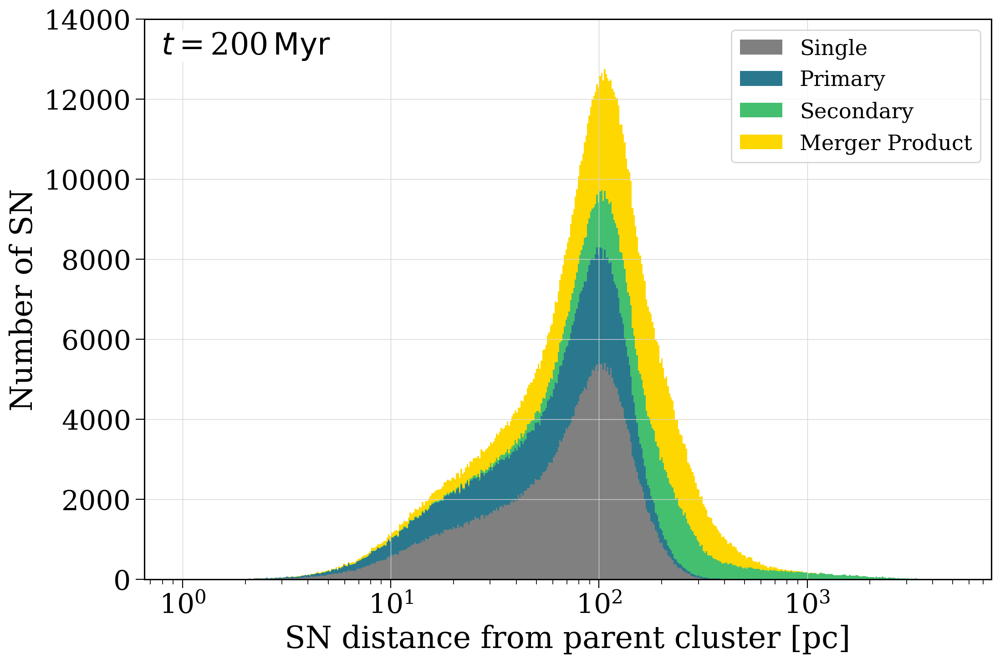

In [349]:
p = ce_pops[1.0]
sn_times_1 = p.bpp[(p.bpp["evol_type"] == 15) & ~p.bpp["bin_num"].isin(p.avoid_these)]["tphys"].values
sn_times_2 = p.bpp[(p.bpp["evol_type"] == 16) & ~p.bpp["bin_num"].isin(p.avoid_these)]["tphys"].values
bins = np.geomspace(1e0, 5e3, 500)

frames = np.concatenate((np.arange(0, 60 + 2, 2), np.arange(80, 200 + 20, 20)))

def time_evolve_distances(bar_container, t_label):
    def animate(frame_number):
        print(frame_number)
        time_valid_1 = sn_times_1 < frame_number
        time_valid_2 = sn_times_2 < frame_number
        
        t_label.set_text(r"$t = $" + str(frame_number) + r"$ \, {\rm Myr}$")
        
        data = [
            p.primary_sn_distances.to(u.pc).value[p.sn_singles & time_valid_1],
            p.primary_sn_distances.to(u.pc).value[p.sn_1 & time_valid_1],
            p.secondary_sn_distances.to(u.pc).value[p.sn_2 & time_valid_2],
            np.concatenate((p.primary_sn_distances.to(u.pc).value[p.sn_1_merger & time_valid_1],
                            p.secondary_sn_distances.to(u.pc).value[p.sn_2_merger & time_valid_2]))
        ]
        
        ns = np.array([np.histogram(d, bins)[0] for d in data])
        ys = np.zeros_like(ns)
        for i in range(1, len(ns)):
            ys[i] = np.sum(ns[:i, :], axis=0)
        for i in range(len(data)):
            for count, rect, y in zip(ns[i], bar_container[i].patches, ys[i]):
                rect.set_height(count)
                rect.set_y(y)
        return np.concatenate([bc.patches for bc in bar_container])
    return animate

fig, ax = plt.subplots()

bar_container = ax.hist([p.primary_sn_distances.to(u.pc).value[p.sn_singles],
                         p.primary_sn_distances.to(u.pc).value[p.sn_1],
                         p.secondary_sn_distances.to(u.pc).value[p.sn_2],
                         np.concatenate((p.primary_sn_distances.to(u.pc).value[p.sn_1_merger], p.secondary_sn_distances.to(u.pc).value[p.sn_2_merger]))],
                        bins=bins, label=["Single", "Primary", "Secondary", "Merger Product"], stacked=True,
                        color=["grey", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"])[-1]
ax.legend(fontsize=0.7*fs)
ax.set_ylabel(ylabel="Number of SN")
ax.set(xscale="log", xlabel="SN distance from parent cluster [pc]")
ax.grid(linewidth=0.5, color="lightgrey")
ax.set_ylim(top=14000)
t_label = ax.annotate(r"$t = 0 {\rm Myr}$", xy=(0.02, 0.98), xycoords="axes fraction", va="top",
                      bbox=dict(boxstyle="round", fc="white", ec="white", pad=0.0),
                      fontsize=fs)


ani = animation.FuncAnimation(fig, time_evolve_distances(bar_container, t_label), frames,
                              repeat=False, blit=True)
ani

In [355]:
FFwriter = animation.FFMpegWriter(fps=1)
ani.save("test.mp4",
         progress_callback=lambda i, n: print(f'Saving frame {i}/{n}'))

MovieWriter ffmpeg unavailable; using Pillow instead.


0
0
Saving frame 0/39
2
Saving frame 1/39
4
Saving frame 2/39
6
Saving frame 3/39
8
Saving frame 4/39
10
Saving frame 5/39
12
Saving frame 6/39
14
Saving frame 7/39
16
Saving frame 8/39
18
Saving frame 9/39
20
Saving frame 10/39
22
Saving frame 11/39
24
Saving frame 12/39
26
Saving frame 13/39
28
Saving frame 14/39
30
Saving frame 15/39
32
Saving frame 16/39
34
Saving frame 17/39
36
Saving frame 18/39
38
Saving frame 19/39
40
Saving frame 20/39
42
Saving frame 21/39
44
Saving frame 22/39
46
Saving frame 23/39
48
Saving frame 24/39
50
Saving frame 25/39
52
Saving frame 26/39
54
Saving frame 27/39
56
Saving frame 28/39
58
Saving frame 29/39
60
Saving frame 30/39
60
Saving frame 31/39
80
Saving frame 32/39
100
Saving frame 33/39
120
Saving frame 34/39
140
Saving frame 35/39
160
Saving frame 36/39
180
Saving frame 37/39
200
Saving frame 38/39


ValueError: unknown file extension: .mp4

# 2D distributions

In [220]:
def sn_hexbin(p, C=None, sn_type="primary", fig=None, ax=None, show=True,
              xscale="log", bins="log", gridsize=100, cmap="magma", cbar_label="Number of SNe", **kwargs):
    if fig is None or ax is None:
        fig, ax = plt.subplots()

    if sn_type == "primary" or sn_type == "single":
        extent = (np.log10(5e-1), np.log10(2e3), 0, 300)
        x = p.primary_sn_distances.to(u.pc).value[p.sn_singles if sn_type == "singles" else p.sn_1]
        y = p.bpp[p.bpp["evol_type"] == 15]["tphys"].values
    else:
        extent = (0, np.log10(5e4), 0, 250)
        x = p.secondary_sn_distances.to(u.pc).value
        y = p.bpp[p.bpp["evol_type"] == 16]["tphys"].values

    hexbin = ax.hexbin(x, y, C, xscale="log", bins=bins, gridsize=gridsize, cmap=cmap,
                       extent=extent)
    fig.colorbar(hexbin, label=cbar_label, ax=ax)

    ax.set(xlim=(10**extent[0], 10**extent[1]), ylim=(extent[2], extent[3]),
           xlabel="Distance to parent cluster [pc]", ylabel="Time since cluster birth [Myr]")

    if show:
        plt.show()
        
    return fig, ax

### By the numbers

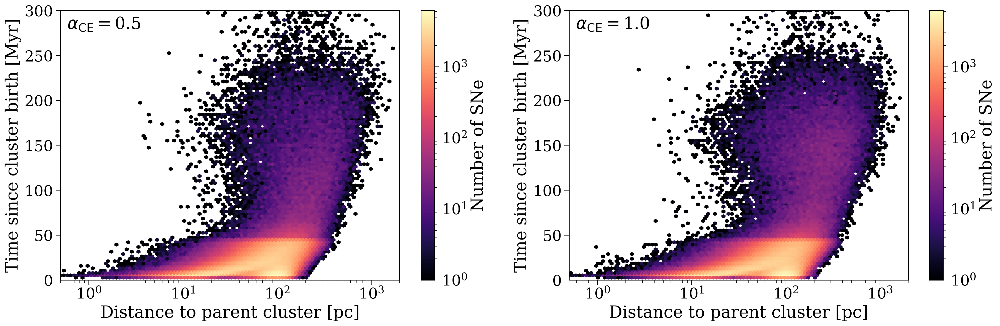

In [85]:
fig, axes = plt.subplots(1, 2, figsize=(24, 7))
for i, ce in enumerate(ce_pops):
    if i == 2:
        break
    sn_hexbin(ce_pops[ce], fig=fig, ax=axes[i], show=False)
    axes[i].annotate(r"$\alpha_{\rm CE} = $" + f"{ce}", xy=(0.02, 0.98), xycoords="axes fraction", fontsize=fs, va="top",
                     bbox=dict(boxstyle="round", ec="white", fc="white", pad=0.0))
plt.show()

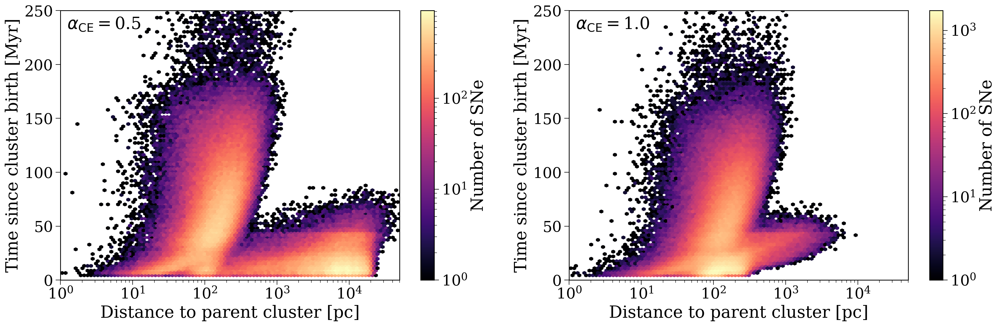

In [86]:
fig, axes = plt.subplots(1, 2, figsize=(24, 7))
for i, ce in enumerate(ce_pops):
    if i == 2:
        break
    sn_hexbin(ce_pops[ce], fig=fig, ax=axes[i], show=False, primary=False)
    axes[i].annotate(r"$\alpha_{\rm CE} = $" + f"{ce}", xy=(0.02, 0.98), xycoords="axes fraction", fontsize=fs, va="top",
                     bbox=dict(boxstyle="round", ec="white", fc="white", pad=0.0))
plt.show()

### Secondary distance tail

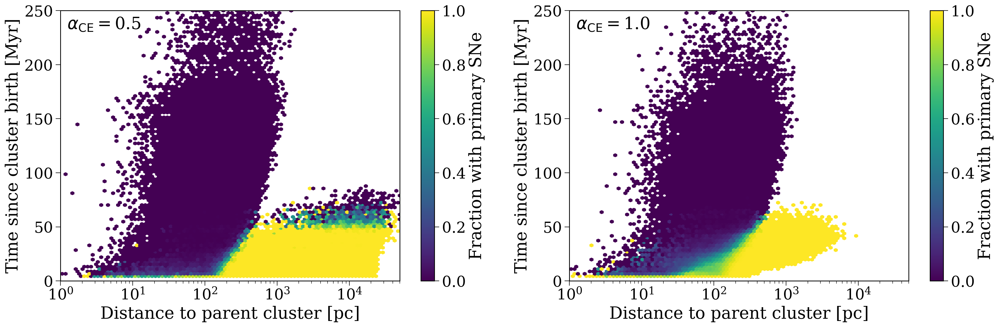

In [89]:
fig, axes = plt.subplots(1, 2, figsize=(24, 7))
for i, ce in enumerate(ce_pops):
    if i == 2:
        break
    sn_1_bns = ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 15]["bin_num"].unique()
    sn_2_bns = ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 16]["bin_num"].unique()
    sn_hexbin(ce_pops[ce], C=np.isin(sn_2_bns, sn_1_bns).astype(int), cbar_label="Fraction with primary SNe",
              bins=None, fig=fig, ax=axes[i], show=False, primary=False, reduce_C_function=lambda C: np.sum(C) / len(C), cmap="viridis")
    axes[i].annotate(r"$\alpha_{\rm CE} = $" + f"{ce}", xy=(0.02, 0.98), xycoords="axes fraction", fontsize=fs, va="top",
                     bbox=dict(boxstyle="round", ec="white", fc="white", pad=0.0))
plt.show()

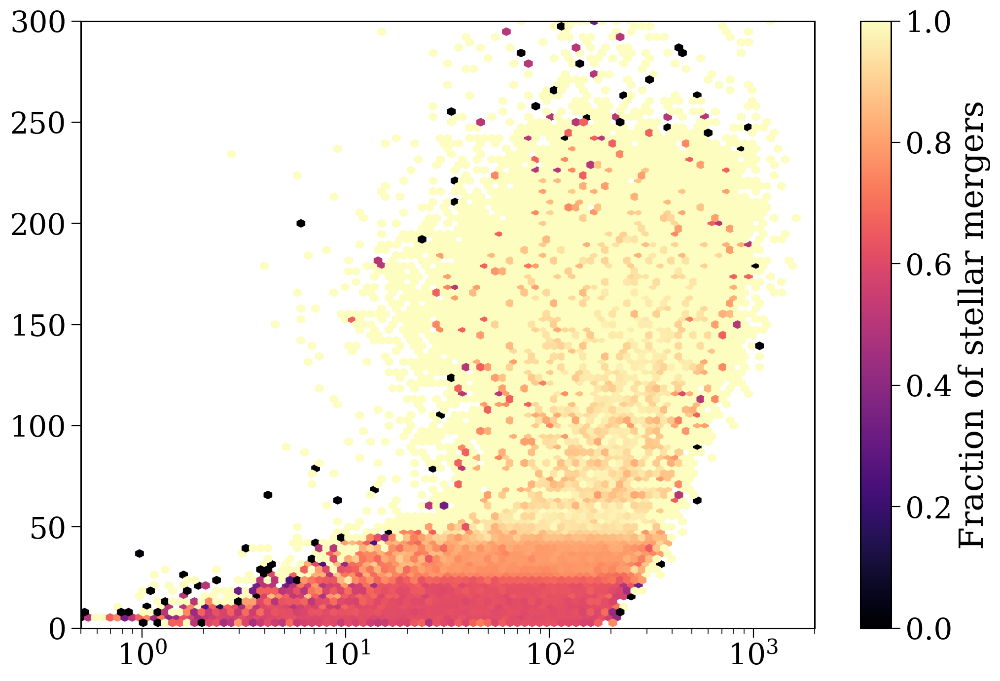

In [348]:
fig, ax = plt.subplots()

hexbin = ax.hexbin(primary_sn_distances.to(u.pc),
                   primary_sn_rows["tphys"],
                   (primary_sn_rows["sep"] == 0.0) | (primary_sn_rows["RRLO_2"] >= 1.0),
                   xscale="log", gridsize=100, cmap="magma",
                   extent=(np.log10(5e-1), np.log10(2e3), 0, 300))
fig.colorbar(hexbin, label="Fraction of stellar mergers")

ax.set(xlim=(5e-1, 2e3), ylim=(0, 300))

plt.show()

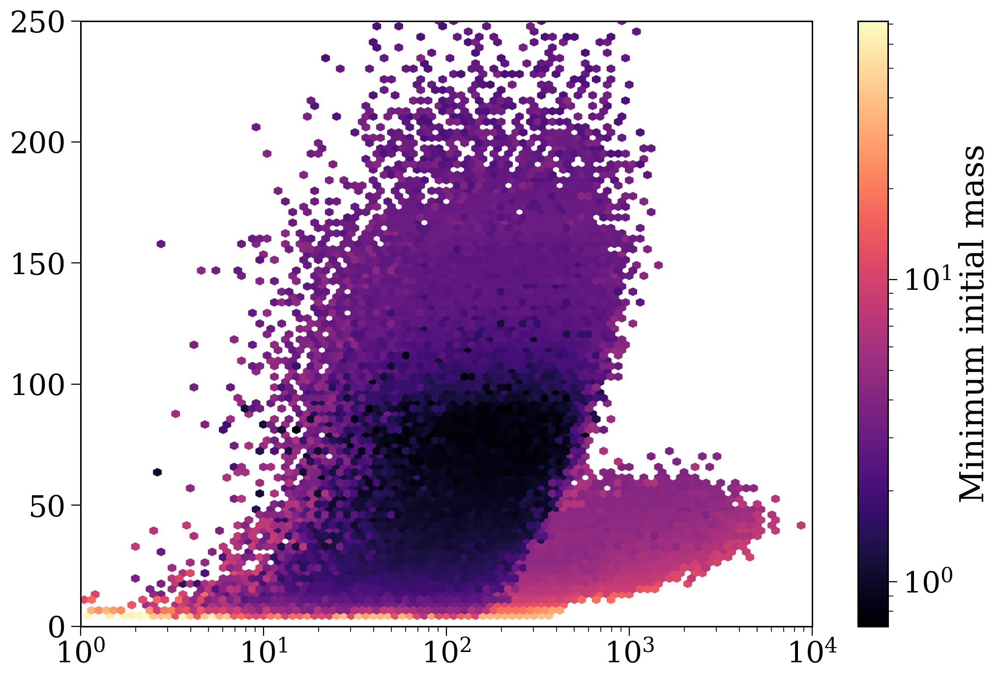

In [351]:
fig, ax = plt.subplots()

hexbin = ax.hexbin(secondary_sn_distances.to(u.pc),
                   secondary_sn_rows["tphys"],
                   C=p.initC.loc[secondary_sn_rows["bin_num"]]["mass_2"],
                   xscale="log", bins="log", gridsize=100, cmap="magma", extent=(0, 4, 0, 250), reduce_C_function=np.min)
fig.colorbar(hexbin, label="Minimum initial mass")

ax.set(xlim=(1e0, 1e4), ylim=(0, 250))

plt.show()

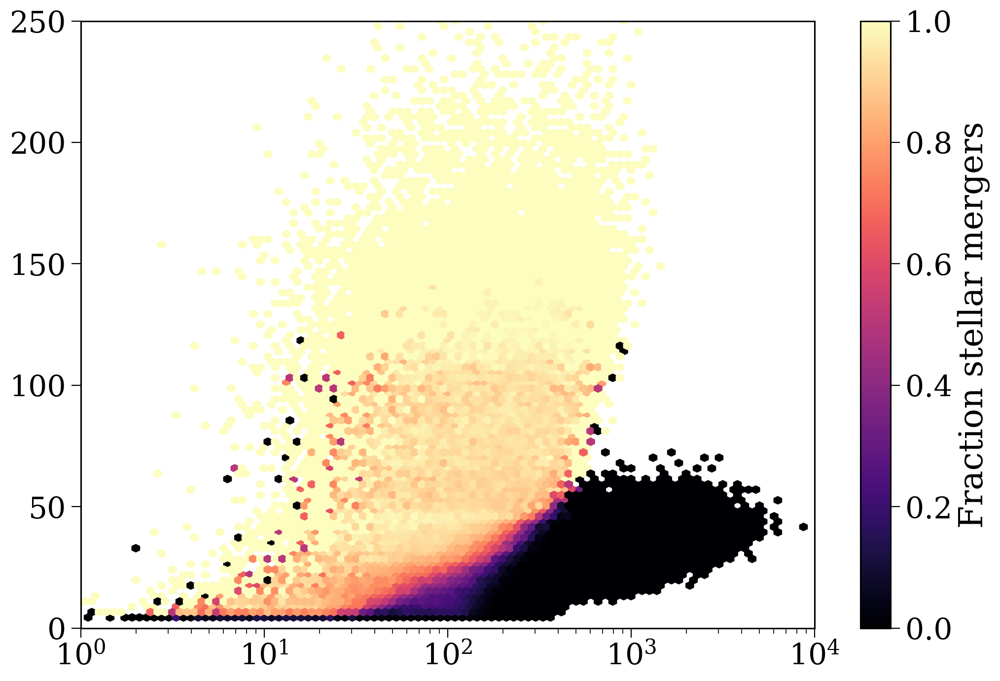

In [318]:
fig, ax = plt.subplots()

hexbin = ax.hexbin(secondary_sn_distances.to(u.pc),
                   secondary_sn_rows["tphys"],
                   C=secondary_sn_rows["sep"] == 0.0,
                   xscale="log", gridsize=100, cmap="magma", extent=(0, 4, 0, 250))
fig.colorbar(hexbin, label="Fraction stellar mergers")

ax.set(xlim=(1e0, 1e4), ylim=(0, 250))

plt.show()

# Scratch

## Reverse supernovae

In [124]:
sn_1_times = ce_pops[ce].bpp[(ce_pops[ce].bpp["evol_type"] == 15) & (ce_pops[ce].bpp["sep"] != 0)]["tphys"]
sn_2_times = ce_pops[ce].bpp[(ce_pops[ce].bpp["evol_type"] == 16) & (ce_pops[ce].bpp["sep"] != 0)]["tphys"]

In [125]:
sn_times = np.ones((2, len(ce_pops[ce]))) * np.inf
sn_times[0][np.isin(ce_pops[ce].bin_nums, sn_1_times.index)] = sn_1_times
sn_times[1][np.isin(ce_pops[ce].bin_nums, sn_2_times.index)] = sn_2_times

In [127]:
reverse_rows = ce_pops[ce].bpp.loc[ce_pops[ce].bin_nums[sn_times[1] < sn_times[0]]]

In [134]:
reverse_SNs = reverse_rows[(reverse_rows["evol_type"] == 16) & (reverse_rows["sep"] != 0)]

In [190]:
reverse_SNs[["kstar_1", "kstar_2"]].value_counts(sort=True)

kstar_1  kstar_2
11.0     9.0        3704
15.0     9.0        3197
8.0      12.0       2616
15.0     8.0        1228
12.0     9.0        1147
         5.0         619
7.0      9.0         477
12.0     6.0         426
8.0      9.0         338
11.0     8.0         300
12.0     8.0          65
11.0     6.0          52
8.0      8.0          20
7.0      8.0          18
11.0     12.0         12
7.0      12.0         12
6.0      6.0           3
11.0     5.0           2
15.0     5.0           2
Name: count, dtype: int64

In [ ]:
reverse_SNs[(reverse_SNs["kstar_1"] == 8) & (reverse_SNs["kstar_2"] == 12)]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
390,94.264242,1.117433,1.385311,8.0,12.0,3.758180,0.533741,0.0,1.000656,0.004162,16.0,11.181614,1.450799,10.314654,1.000000e+10,0.812272,1.379720,6.615860,0.000189,1.363017,1.310412,8169.287845,1.868727,21430.016240,492802.857544,0.050851,0.000189,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,59.571210,1.903432e+10,0.0,0.0,0.0,0.0,0.0,0.0,83.082629,92.813074,0.0,0.0,390
3375,79.238860,1.413723,1.381328,8.0,12.0,6.478437,1.143096,0.0,1.000410,0.000392,16.0,9.847855,2.073403,9.106896,1.000000e+10,0.844363,1.378270,4.591474,0.000470,1.442551,1.371691,8639.816436,1.212056,26086.732475,280505.224995,0.049023,0.000470,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1888.493045,1.119669e+08,0.0,0.0,0.0,0.0,0.0,0.0,69.391005,77.162373,0.0,0.0,3375
3814,99.016960,1.081358,1.383867,8.0,12.0,2.294796,0.256602,0.0,1.001225,0.006820,16.0,11.960824,3.529633,11.043684,1.000000e+10,0.780128,1.378462,3.223945,0.000443,1.321782,1.311446,7155.708266,0.658352,29698.805512,248021.940006,0.052706,0.000443,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,213.756361,3.613557e+09,0.0,0.0,0.0,0.0,0.0,0.0,87.056136,95.486737,0.0,0.0,3814
3840,79.122664,1.418957,1.381361,8.0,12.0,6.897530,1.254610,0.0,1.000772,0.000382,16.0,9.762622,1.767122,9.026132,1.000000e+10,0.849533,1.378094,4.972675,0.000494,1.448467,1.371276,8815.369332,1.442103,25193.278660,285958.701057,0.048730,0.000494,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1713.755260,1.074217e+08,0.0,0.0,0.0,0.0,0.0,0.0,69.360043,77.352500,0.0,0.0,3840
4533,90.470353,1.189453,1.385010,8.0,12.0,5.575851,0.951033,0.0,1.000688,0.002266,16.0,11.088597,1.561696,10.216257,1.000000e+10,0.825260,1.379058,9.805107,0.000347,1.368936,1.379058,8754.874316,1.671407,17910.425962,353939.996258,0.050108,0.000347,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,114.069741,5.504787e+09,0.0,0.0,0.0,0.0,0.0,0.0,79.381756,88.908289,0.0,0.0,4533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2159146,87.943289,1.376267,1.383482,8.0,12.0,1.079575,0.078256,0.0,1.000744,0.013950,16.0,7.724548,0.819907,7.265176,1.000000e+10,0.853437,1.376581,1.808578,0.000661,1.602926,1.320142,6839.717878,2.944487,39206.725116,295331.584987,0.048509,0.000661,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,4164.410693,1.789558e+09,0.0,0.0,0.0,0.0,0.0,0.0,80.218741,87.123001,0.0,0.0,2159146
2159360,107.425877,0.953261,1.383631,8.0,12.0,4.602181,0.748511,0.0,1.000650,0.003768,16.0,14.164307,4.219208,12.974137,1.000000e+10,0.787537,1.378907,5.238381,0.000374,1.230612,1.278956,8689.844391,0.560654,24458.176996,259498.214243,0.052276,0.000374,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,11.172473,4.869379e+09,0.0,0.0,0.0,0.0,0.0,0.0,93.261570,103.205684,0.0,0.0,2159360
2163783,76.994191,1.397846,1.381050,8.0,12.0,7.367154,1.390227,0.0,1.000733,0.001031,16.0,16.891587,1.317534,15.393619,1.000000e+10,0.784569,1.374102,9.527511,0.000869,1.142355,1.319673,9725.305291,2.177542,18653.300691,238910.043784,0.052448,0.000869,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,805.727649,2.824068e+08,0.0,0.0,0.0,0.0,0.0,0.0,60.102604,75.675924,0.0,0.0,2163783
2163986,77.752158,1.599967,1.385934,8.0,12.0,1.810068,0.163334,0.0,1.001187,0.006908,16.0,16.921853,0.491132,15.427360,1.000000e+10,0.778631,1.377929,3.023457,0.000515,1.141278,1.385934,9377.118424,5.886034,32812.177157,398091.602978,0.052793,0.000515,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,4150.084091,2.373097e+09,0.0,0.0,0.0,0.0,0.0,0.0,60.830305,77.260656,0.0,0.0,2163986


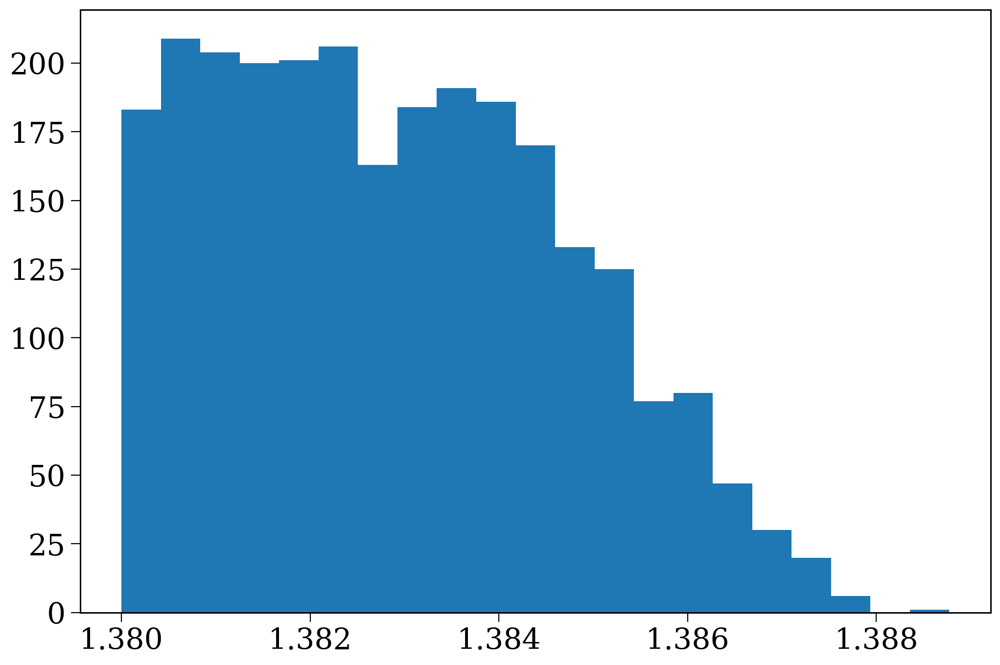

In [194]:
plt.hist(reverse_SNs[(reverse_SNs["kstar_1"] == 8) & (reverse_SNs["kstar_2"] == 12)]["mass_2"].values, bins="fd");

## COSMIC BUG: MR bound binaries

In [203]:
# bound ones
for ce in ce_pops:
    print(len(ce_pops[ce].final_bpp[((ce_pops[ce].final_bpp["kstar_1"] == 15) | (ce_pops[ce].final_bpp["kstar_2"] == 15)) & (ce_pops[ce].final_bpp["sep"] > 0.0)]))

119
17221
21658
24768
27898
34586
41500


In [204]:
# disrupted ones
for ce in ce_pops:
    print(len(ce_pops[ce].final_bpp[((ce_pops[ce].final_bpp["kstar_1"] == 15) | (ce_pops[ce].final_bpp["kstar_2"] == 15)) & (ce_pops[ce].final_bpp["sep"] < 0.0)]))

0
22
44
38
57
60
78


In [218]:
x = ce_pops[ce].final_bpp[((ce_pops[ce].final_bpp["kstar_1"] == 15) | (ce_pops[ce].final_bpp["kstar_2"] == 15)) & (ce_pops[ce].final_bpp["sep"] < 0.0)]["bin_num"].values

In [219]:
ce_pops[ce].bpp.loc[x[0]]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
16165,0.000000,6.580681,6.148415,1.0,1.0,82.706857,24.433499,0.164639,0.120243,0.119251,1.0,0.000000,0.000000,55.441133,6.454779e+01,0.000000,0.000000,3.196895,3.073611,6.580681,6.148415,1379.066930,1.087704e+03,19760.673429,18992.094234,0.000000,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,3.411371e+03,4.087201e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,16165
16165,55.692234,6.543338,6.129134,2.0,1.0,83.076163,24.652225,0.164643,0.279562,0.235272,2.0,56.144032,55.936093,56.144027,6.500882e+01,1.213705,0.000000,7.461560,6.094618,6.543338,6.129134,4106.446053,2.154826e+03,16991.093386,16001.083630,0.236314,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,7.340445e+02,1.013929e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-0.451798,-0.243859,0.0,0.0,16165
16165,55.788408,6.543150,6.129085,2.0,1.0,69.400087,18.822858,0.000000,1.000839,0.235923,3.0,56.243788,56.033274,56.147604,6.500999e+01,1.226015,0.000000,26.713164,6.111654,6.543150,6.129085,2981.282803,2.158602e+03,8289.106872,15985.764192,0.238055,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.219193e+02,1.219193e+02,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-0.455380,-0.244865,0.0,0.0,16165
16165,55.882766,3.525078,9.146853,3.0,1.0,99.465090,32.296598,0.000000,3.991495,0.119177,2.0,57.118141,16.223284,56.925383,2.802040e+01,1.227648,0.000000,119.163346,5.490571,6.502702,9.146853,2138.606221,6.450052e+03,3611.860535,22174.387707,0.238285,0.000000,1.148715e+00,1.000000e-10,7.730129e+01,1.000000e-10,5.009505e+01,4.645143e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-1.235375,39.659483,0.0,0.0,16165
16165,55.962590,1.330827,11.340037,4.0,1.0,437.221818,297.660895,0.000000,3.392920,0.023316,2.0,57.197964,8.909111,56.925383,1.892985e+01,1.228726,0.000000,321.280136,5.763333,6.502702,11.340037,7238.141264,1.167730e+04,2983.557670,25105.471293,0.238437,0.000000,1.076289e-02,1.000000e-10,1.829303e+02,1.000000e-10,7.408251e+00,4.818821e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-1.235375,47.053478,0.0,0.0,16165
16165,55.981371,1.238728,11.432112,4.0,1.0,494.562007,358.096915,0.000000,0.974700,0.020444,4.0,57.216745,8.735755,56.925383,1.866876e+01,1.229779,0.000000,102.022721,5.781237,6.502702,11.432112,7038.193575,1.195006e+04,5257.586931,25211.676439,0.238818,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.071868e-11,4.814576e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-1.235375,47.245616,0.0,0.0,16165
16165,56.064499,1.234439,11.433980,7.0,1.0,494.451908,358.011546,0.000000,0.002301,0.020507,2.0,0.179477,8.816437,12.882827,1.866353e+01,0.000000,0.000000,0.240507,5.800616,1.234439,11.433980,510.881430,1.200675e+04,56206.380565,25199.325521,0.000000,0.000000,1.234439e+00,1.000000e-10,2.405072e-01,1.000000e-10,1.778126e-04,4.781683e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,55.885022,47.248062,0.0,0.0,16165
16165,66.115944,1.213317,11.079793,7.0,2.0,509.546823,380.204641,0.000000,0.002646,0.036247,2.0,10.466301,19.706888,13.399597,1.970688e+01,0.000000,2.472556,0.286195,10.544993,1.213317,11.079793,867.533455,2.475943e+04,58817.955890,22396.575138,0.000000,0.386220,1.213317e+00,1.000000e-10,2.861953e-01,1.000000e-10,2.420353e+00,1.451451e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,55.649643,46.409056,0.0,0.0,16165
16165,66.163139,1.213178,11.075751,7.0,3.0,480.722724,348.463360,0.000000,0.002802,0.901248,2.0,10.516251,19.766650,13.403116,1.971942e+01,0.000000,2.520765,0.285930,247.348976,1.213178,11.075752,869.948692,1.251556e+04,58886.130479,3899.214524,0.000000,0.391186,1.213178e+00,4.281662e+00,2.859302e-01,1.606068e+02,1.350061e+02,2.928909e+00,0.0,0.000000e+00,0.0,0.0,0.0,0.0,55.646888,46.396490,0.0,0.0,16165
16165,66.163571,1.213177,11.075677,7.0,

## COSMIC BUG: Disruption logging

In [86]:
ki_disrupted = p.kick_info[p.kick_info["disrupted"] == 1.0]["bin_num"].unique()
et_disrupted = p.bpp[p.bpp["evol_type"] == 11.0]["bin_num"].unique()
sep_disrupted = p.bpp[p.bpp["sep"] == -1.0]["bin_num"].unique()

In [87]:
ki = np.isin(p.bin_nums, ki_disrupted)
et = np.isin(p.bin_nums, et_disrupted)
sep = np.isin(p.bin_nums, sep_disrupted)

### Combos

In [88]:
(ki & et & sep).sum()

225418

In [89]:
(ki & ~et & ~sep).sum()

424

In [90]:
(sep & ~ki & ~et).sum()

63

In [91]:
(et & ~ki & ~sep).sum()

0

In [92]:
(ki & et & ~sep).sum()

0

In [93]:
(ki & sep & ~et).sum()

0

In [94]:
(~ki & sep & et).sum()

17

### Kick ones

In [98]:
test = p.bin_nums[(ki & ~sep & ~et)]

In [99]:
any([(p.kick_info.loc[b]["vsys_2_total"] != 0.0).any() for b in test])

False

In [104]:
p.initC.loc[test].to_hdf("kick_dis_test.h5", key="initC")

In [14]:
p.kick_info.loc[269]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
269,1.0,1.0,590.460339,-8.865235,65.045618,0.0,2.059752,-10.394166,36.927358,38.417588,-0.0,0.0,0.0,0.0,0.0,0.0,-1.426049e+09,269.0
269,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,269.0


### Sep ones

In [91]:
p.bin_nums[(sep & ~ki & ~et)]

array([   5123,    8763,   73614,  147690,  157138,  203929,  255815,
        258577,  266632,  304629,  392809,  397720,  427693,  445489,
        467689,  475197,  480280,  552180,  556248,  558524,  558837,
        589034,  603556,  610923,  613707,  618758,  674078,  799256,
        825009,  833624,  888559,  908925,  922842, 1018228, 1109464,
       1154812, 1167422, 1172913, 1201028, 1245024, 1294924, 1297502,
       1317547, 1351704, 1439241, 1490613, 1534754, 1614816, 1644207,
       1736746, 1742258, 1749024, 1749303, 1766457, 1875303, 1897690,
       1898076, 1935432, 2020192, 2028612, 2054943, 2107016, 2155994])

In [122]:
p.bpp.loc[908925]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
908925,0.000000,9.187160,9.105399,1.0,1.0,127.945503,39.216828,0.195627,0.102651,0.102525,1.0,0.000000,0.000000,2.718431e+01,27.666215,0.000000,0.000000,4.011239,3.990000,9.187160,9.105399,4.335018e+03,4209.155936,23489.731933,23379.323034,0.000000,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.686905e+03,2702.062411,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,908925
908925,27.644128,8.968076,8.903569,2.0,1.0,130.952157,41.082691,0.195623,0.236414,0.277608,2.0,28.510133,28.445659,2.851013e+01,28.922226,1.858242,0.000000,9.451698,11.062068,8.968076,8.903569,1.277395e+04,9911.742951,20049.149838,17393.579273,0.318803,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,5.040753e+02,294.515218,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.866005,-0.801531,0.0,0.0,908925
908925,27.682047,8.967263,8.903046,2.0,1.0,105.341593,29.641894,0.000000,1.001566,0.278939,3.0,28.553186,28.486907,2.851526e+01,28.925610,1.876193,0.000000,40.044249,11.115866,8.967263,8.903046,8.914951e+03,9928.698816,8902.854500,17358.853985,0.320899,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,7.741984e+01,77.419837,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.871139,-0.804861,0.0,0.0,908925
908925,27.722120,6.442230,11.426607,3.0,1.0,116.120030,34.307157,0.000000,5.487103,0.161192,2.0,28.955262,13.943576,2.887641e+01,18.142568,1.879047,0.000000,210.614217,8.035832,8.910661,11.426607,5.998459e+03,16937.121539,3515.893350,23332.651847,0.321232,0.000000,2.281591e+00,1.000000e-10,1.366904e+02,1.000000e-10,4.769408e+01,2931.748295,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-1.233142,13.778544,0.0,0.0,908925
908925,27.740640,2.223913,15.644485,4.0,1.0,500.786486,307.261578,0.000000,5.802823,0.028729,2.0,28.973782,6.215015,2.887641e+01,11.045125,1.879339,0.000000,664.820066,7.907561,8.910661,15.644485,1.829538e+04,34705.915845,2615.187924,28141.627840,0.321266,0.000000,5.672310e-02,1.000000e-10,4.232662e+02,1.000000e-10,6.960620e+00,3520.890196,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-1.233142,21.525626,0.0,0.0,908925
908925,27.751831,1.893102,15.975090,4.0,1.0,659.125892,463.964137,0.000000,0.750662,0.021350,4.0,28.984973,5.922393,2.887641e+01,10.725693,1.881244,0.000000,107.457483,7.944664,8.910661,15.975090,1.773453e+04,36465.331935,6454.405137,28425.092741,0.321844,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,6.351090e+00,3530.616661,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-1.233142,21.829438,0.0,0.0,908925
908925,27.784367,1.886783,15.976935,7.0,1.0,659.088226,463.982456,0.000000,0.002262,0.021401,2.0,0.066404,5.953976,5.202332e+00,10.723969,0.000000,0.000000,0.323527,7.967084,1.886783,15.976935,1.992169e+03,36589.516133,68099.797755,28409.204891,0.000000,0.000000,1.886783e+00,1.000000e-10,3.235271e-01,1.000000e-10,8.520329e-04,3510.271485,0.000000e+00,0.0,0.0,0.0,0.0,0.0,27.717963,21.830391,0.0,0.0,908925
908925,32.613080,1.793389,15.283662,7.0,2.0,689.447543,507.712147,0.000000,0.002345,0.035895,2.0,5.194392,11.418995,5.760147e+00,11.418992,0.000000,3.817881,0.350137,13.991604,1.793389,15.283662,3.353304e+03,64924.078961,74562.216455,24742.143021,0.000000,0.512404,1.793389e+00,1.000000e-10,3.501370e-01,1.000000e-10,2.897088e+00,1067.572131,0.000000e+00,0.0,0.0,0.0,0.0,0.0,27.418687,21.194085,0.0,0.0,908925
908925,32.631147,1.792931,15.267428,7.0,2.0,689.963219,508.530476,0.000000,0.002336,1.001829,3.0,5.215156,11.437062,5.763133e+00,11.418992,0.000000,3.879198,0.349202,390.750082,1.792931,15.283662,3.359853e+03,70216.952102,74698.377423,4774.529330,0.000000,0.517660,1.792931e+00,1.000000e-10,3.492023e-01,1.000000e-10,4.512749e+00,4.512749,0.000000e+00,0.0,0.0,0.0,0.0,0.0,27.415990,21.194085,0.0,0.0,908925
908925,32.631147,1.79

### Sep + et ones

In [113]:
p.bin_nums[(~ki & sep & et)]

array([  78581,  192770,  358571,  387481,  522900,  639082,  898606,
        925047,  999915, 1228652, 1247649, 1393649, 1477686, 1683145,
       1740706, 1886230, 1923534])

In [128]:
test = 1228652
p.kick_info.loc[test]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
1228652,1.0,0.0,139.140517,-7.671457,335.055048,116.79426,-9.841622,7.493985,-8.636241,15.086484,0.0,0.0,0.0,0.0,160.353972,131.817437,-328582398.0,1228652.0
1228652,2.0,0.0,331.892089,77.082739,253.113692,202.01894,28.019595,-212.476706,150.699226,250.060485,-0.0,0.0,0.0,0.0,145.142697,24.224611,864283342.0,1228652.0


In [127]:
p.bpp.loc[test]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
1228652,0.000000,57.210350,34.547387,1.0,1.0,3515.280042,2521.684243,0.696607,2.698267e-02,0.024336,1.0,0.000000,0.000000,3.891888e+00,5.100770e+00,0.000000,0.000000,12.179158,8.726032,57.210350,34.547387,4.735747e+05,1.675955e+05,43582.095564,39712.459113,0.000000,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,8.294607e+02,1.178558e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1228652
1228652,4.070302,42.642046,32.145384,2.0,1.0,4313.298301,3796.401154,0.696607,7.268213e-02,0.036307,2.0,4.470026,4.193475,4.470026e+00,5.375427e+00,15.263032,0.000000,38.388275,16.854087,42.642046,32.145384,6.301968e+05,2.591110e+05,26365.703651,31863.131608,1.213888,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.268205e+01,1.788934e+02,0.0,0.0,0.0,0.0,0.0,0.0,-0.399725,-0.123173,0.0,0.0,1228652
1228652,4.073773,42.335779,32.149659,2.0,1.0,1313.477836,639.249790,0.000000,1.001001e+00,0.036158,3.0,4.473498,4.196525,4.470026e+00,5.374887e+00,15.465918,0.000000,529.806249,16.876848,42.642046,32.149659,6.058968e+05,2.593507e+05,7027.659970,31849.000515,1.223713,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,3.589943e+00,3.589943e+00,0.0,0.0,0.0,0.0,0.0,0.0,-0.399725,-0.122752,0.0,0.0,1228652
1228652,4.075524,42.118056,32.222153,4.0,1.0,1312.798763,639.377735,0.000000,3.779932e+00,0.036123,2.0,4.475249,4.184860,4.470026e+00,5.365766e+00,15.568269,0.000000,1996.360284,16.881710,42.642046,32.222153,5.939959e+05,2.604157e+05,3602.433822,31877.054253,1.228649,0.000000,1.819250e+01,1.000000e-10,1.815221e+03,1.000000e-10,2.575684e+00,6.017926e+01,0.0,0.0,0.0,0.0,0.0,0.0,-0.399725,-0.109336,0.0,0.0,1228652
1228652,4.139033,16.168761,53.523232,4.0,1.0,1864.888115,1118.046559,0.000000,2.581573e-01,0.019367,4.0,4.538758,2.039622,4.470026e+00,3.999487e+00,16.072121,0.000000,135.548112,17.508440,42.642046,53.523232,6.063229e+05,5.843335e+05,13896.290165,38309.906374,1.274652,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,3.360915e+01,1.973034e+03,0.0,0.0,0.0,0.0,0.0,0.0,-0.399725,2.099411,0.0,0.0,1228652
1228652,4.139677,16.072121,53.540893,7.0,1.0,1865.639673,1119.356938,0.000000,2.431164e-03,0.019345,2.0,0.062973,2.039979,4.803732e-01,3.998925e+00,0.000000,0.000000,1.274874,17.516125,16.072121,53.540893,3.547892e+05,5.847783e+05,125322.338407,38308.787182,0.000000,0.000000,1.607212e+01,1.000000e-10,1.274874e+00,1.000000e-10,5.104236e-11,1.974975e+03,0.0,0.0,0.0,0.0,0.0,0.0,4.076704,2.099698,0.0,0.0,1228652
1228652,4.644984,8.928389,51.780906,8.0,1.0,2139.472584,1471.989301,0.000000,1.689970e-03,0.017450,2.0,0.699108,2.578907,6.991079e-01,4.057470e+00,6.038414,0.000000,0.873443,19.914510,8.928389,51.780906,1.736417e+05,6.071502e+05,126638.554097,36266.766502,0.000070,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.824708e-02,1.173680e+03,0.0,0.0,0.0,0.0,0.0,0.0,3.945875,2.066077,0.0,0.0,1228652
1228652,4.675239,8.587262,51.673925,8.0,1.0,2155.401991,1493.983286,0.000000,1.689970e-03,0.017450,15.0,0.728995,2.611148,6.991079e-01,4.061154e+00,6.543971,0.000000,1.045019,20.090697,8.928389,51.673925,2.595651e+05,6.085243e+05,128017.443240,36127.805608,0.000070,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.103331e+07,1.134738e+03,0.0,0.0,0.0,0.0,0.0,0.0,3.945875,2.063693,0.0,0.0,1228652
1228652,4.675239,4.248750,51.673925,14.0,1.0,3083.780565,2654.015116,0.754084,1.216581e-07,0.044650,2.0,0.000000,2.611546,6.991079e-01,4.061199e+00,4.248750,0.000000,0.000018,20.092901,8.928389,51.673925,1.000000e-10,6.085413e+05,4319.724949,36126.076342,0.000018,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.103331e+07,1.134264e+03,0.0,0.0,0.0,0.0,0.0,0.0,4.675239,2

## Secondary supernova in bound systems

In [74]:
for ce in ce_pops:
    sn2_bound = ce_pops[ce].bpp[((ce_pops[ce].bpp["evol_type"] == 16) & (ce_pops[ce].bpp["sep"] > 0))]["bin_num"].unique()
    sn1 = ce_pops[ce].bpp[ce_pops[ce].bpp["evol_type"] == 15]["bin_num"].unique()
    test = np.isin(sn2_bound, sn1)
    
    print(test.sum() / (ce_pops[ce].bpp["evol_type"] == 16).sum())

0.005556187560758682
0.007116538370171191
0.007524766317807781
0.0075748112542908105
0.008756909016297932
0.012098275379547444
0.019246359169174342


## Kicks

In [319]:
kicks = p.kick_info[p.kick_info["natal_kick"] > 0.0]

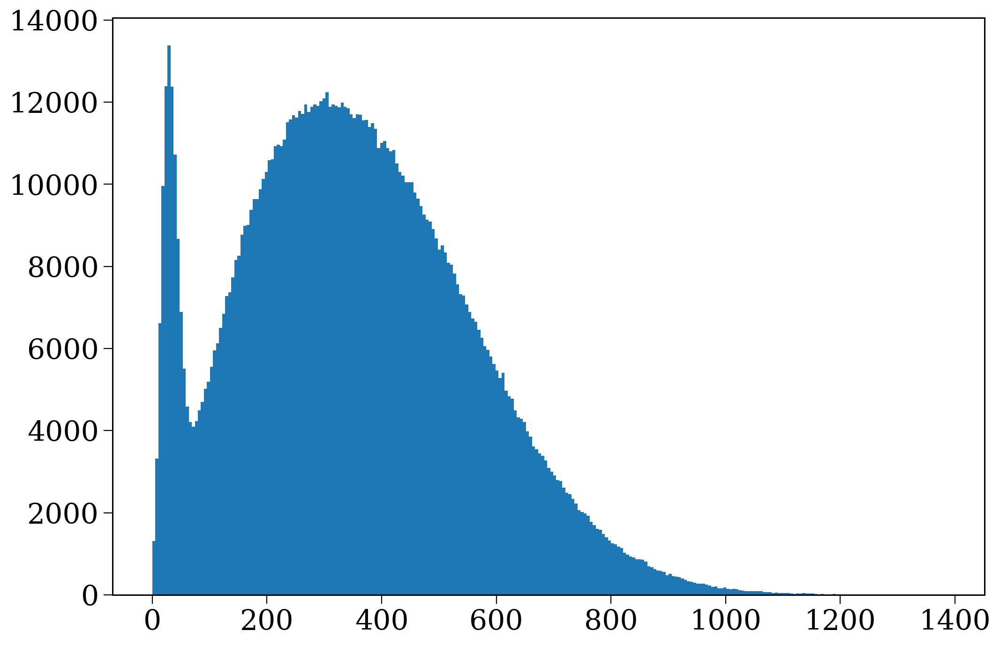

In [320]:
plt.hist(kicks["natal_kick"], bins="fd");

# Temperature stuff

In [84]:
primary_O_ever = p.bpp[((p.bpp["kstar_1"] <= 1) & (p.bpp["teff_1"] >= 30000) & (p.bpp["mass_1"] >= 15) & (p.bpp["tphys"] >= 1.5))]["bin_num"].unique()
secondary_O_ever = p.bpp[((p.bpp["kstar_2"] <= 1) & (p.bpp["teff_2"] >= 30000) & (p.bpp["mass_2"] >= 15))]["bin_num"].unique()
either_O_ever = np.unique(np.concatenate((primary_O_ever, secondary_O_ever)))

In [74]:
primary_O_rows = p.bpp[((p.bpp["kstar_1"] <= 1) & (p.bpp["teff_1"] >= 30000) & (p.bpp["mass_1"] >= 15))]

In [83]:
primary_O_rows[primary_O_rows["tphys"] > 0]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
131,5.011018,26.672567,3.262971,1.0,1.0,25.774644,2.771837,0.0,1.001001,0.371395,3.0,5.125352,5.010830,6.408639,303.152568,0.0,0.0,14.499351,2.098082,26.672567,3.262971,171606.594608,110.411756,30990.516944,12975.143651,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,827.924206,827.924206,0.0,0.0,0.0,0.0,0.0,0.0,-0.114334,0.000188,0.0,0.0,131
273,2.526482,59.301109,23.793135,1.0,1.0,53.479936,4.972480,0.0,1.001293,0.534098,3.0,2.621854,2.541576,3.816745,6.921017,0.0,0.0,24.611216,8.663084,59.301109,23.793135,824831.364525,88713.135740,35220.406794,33996.197354,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,461.514336,461.514336,0.0,0.0,0.0,0.0,0.0,0.0,-0.095372,-0.015095,0.0,0.0,273
626,3.300164,50.768890,32.125745,1.0,1.0,73.900099,8.086796,0.0,1.001931,0.541124,3.0,3.460611,3.371820,4.076507,5.345307,0.0,0.0,31.029277,13.599063,50.768890,32.125745,708206.196631,225765.701111,30194.212757,34271.223783,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,283.779960,283.779960,0.0,0.0,0.0,0.0,0.0,0.0,-0.160447,-0.071656,0.0,0.0,626
689,3.787798,29.442717,5.844590,1.0,1.0,25.755360,2.550142,0.0,1.001989,0.471273,3.0,3.869613,3.787911,5.724601,72.479567,0.0,0.0,13.455430,3.049343,29.442717,5.844590,193349.949011,930.730871,33144.146409,18338.868310,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,899.899203,899.899203,0.0,0.0,0.0,0.0,0.0,0.0,-0.081815,-0.000113,0.0,0.0,689
912,2.161459,59.935959,54.472234,1.0,1.0,57.568840,4.732873,0.0,1.001117,0.938507,3.0,2.228817,2.223796,3.746258,3.881386,0.0,0.0,22.316857,20.027128,59.935959,54.472234,785487.536984,644691.229336,36537.423942,36711.169111,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,484.879018,484.879018,0.0,0.0,0.0,0.0,0.0,0.0,-0.067357,-0.062337,0.0,0.0,912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2164928,3.389587,46.291832,43.003121,1.0,1.0,63.677487,6.232145,0.0,1.146998,1.001633,5.0,3.551008,3.532472,4.222666,4.386473,0.0,0.0,28.142721,23.762330,46.291832,43.003121,588616.305169,491856.718313,30272.245754,31498.128854,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,367.416319,366.162525,0.0,0.0,0.0,0.0,0.0,0.0,-0.161421,-0.142885,0.0,0.0,2164928
2164928,3.389587,89.294954,0.000000,1.0,15.0,0.000000,0.000000,-1.0,0.000000,-1.000000,6.0,2.787738,3.532472,4.222666,4.386473,0.0,0.0,28.142721,23.762330,89.294954,43.003121,588616.305169,491856.718313,30272.245754,31498.128854,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,367.416319,366.162525,0.0,0.0,0.0,0.0,0.0,0.0,0.601849,-0.142885,0.0,0.0,2164928
2165150,3.324538,28.248277,17.139856,1.0,1.0,28.063843,2.557536,0.0,1.000225,0.731176,3.0,3.378950,3.332042,5.836133,9.983043,0.0,0.0,11.867983,6.906722,28.248277,17.139856,162250.218161,36152.395068,33777.497567,30420.607669,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,897.297553,897.297553,0.0,0.0,0.0,0.0,0.0,0.0,-0.054412,-0.007504,0.0,0.0,2165150
2165263,4.389472,18.647142,16.030787,1.0,1.0,20.869011,1.876283,0.0,1.000791,0.907557,3.0,4.411873,4.399800,8.967391,10.925580,0.0,0.0,8.188696,6.930239,18.647142,16.030787,52417.450253,31627.721537,30657.110321,29370.576382,0.0,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1223.093950,1223.093950,0.0,0.0,0.0,0.0,0.0,0.0,-0.022401,-0.010328,0.0,0.0,2165263


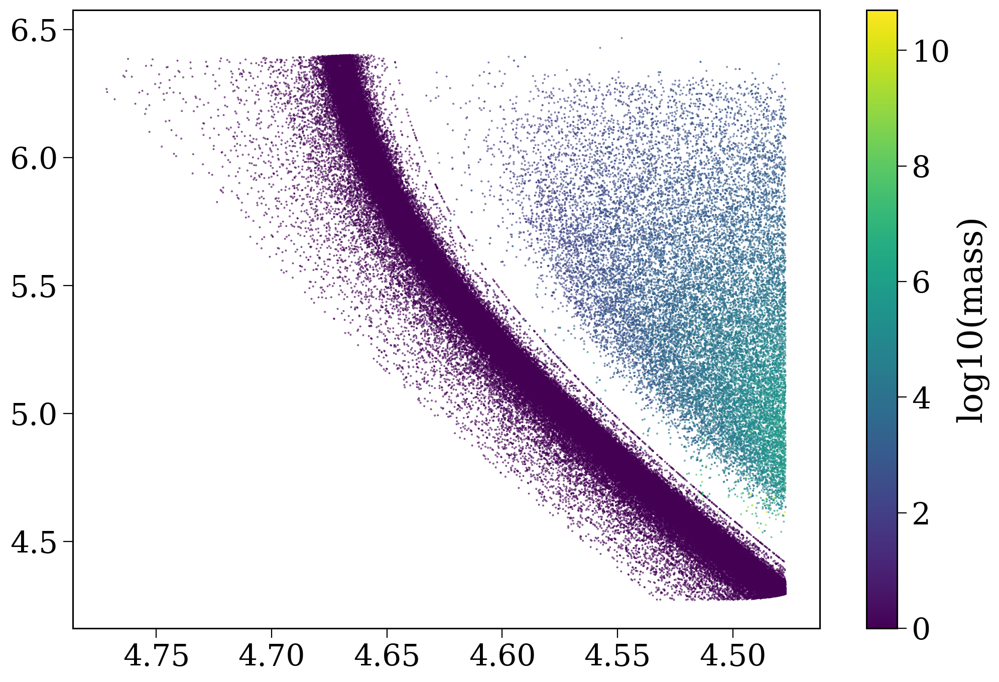

In [82]:
scatter = plt.scatter(np.log10(primary_O_rows["teff_1"]), np.log10(primary_O_rows["lum_1"]), c=primary_O_rows["tphys"], s=0.1)
plt.colorbar(scatter, label='log10(mass)')
plt.gca().invert_xaxis()

In [66]:
len(primary_O_ever), len(secondary_O_ever)

(369897, 149358)

In [85]:
len(primary_O_ever)

17219

In [71]:
len(either_O_ever)

404435

In [69]:
len(either_O_ever)

399343

In [72]:
404435 - 399343

5092

In [ ]:
 | ((p.bpp["kstar_2"] <= 1) & (p.bpp["teff_2"] >= 30000))

In [154]:
true_Ms = np.array([3.5, 3.5, 3.5, 3.5, 3.5, 3.5])
true_Xcs = np.array([0.47, 0.4, 0.3, 0.2, 0.1, 0.01])

best_Ms = np.array([3.5, 3.5, 3.5, 3.1, 3.0, 3.2])
best_Xcs = np.array([0.642, 0.417, 0.309, 0.400, 0.256, 0.021])

ages = np.array([183.74468116, 210.27827824, 240.17608465, 263.63324609,
                 282.34372495, 295.68446573])

from scipy.interpolate import interp1d
X_c_to_ages = interp1d(true_Xcs, ages, fill_value="extrapolate")
ages_to_X_c = interp1d(ages, true_Xcs, fill_value="extrapolate")

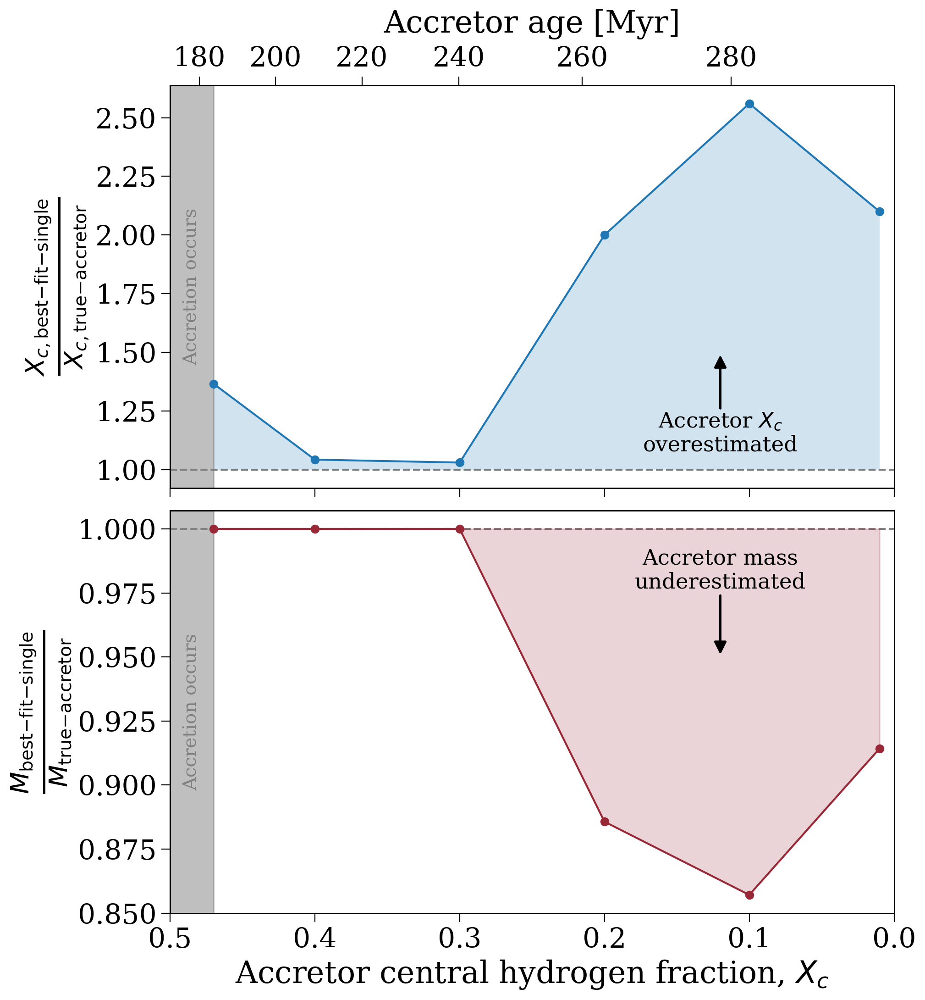

In [158]:
fig, axes = plt.subplots(2, 1, figsize=(10, 11), sharex=True, layout='tight')

axes[0].plot(true_Xcs, best_Xcs / true_Xcs, marker='o', label="best fit")
axes[0].fill_between(true_Xcs, 1.0, best_Xcs / true_Xcs, alpha=0.2)

c = "#992837"
axes[1].plot(true_Xcs, best_Ms / true_Ms, marker='o', label="Truth", color=c)
axes[1].fill_between(true_Xcs, best_Ms / true_Ms, 1.0, alpha=0.2, color=c)

for ax in axes:
    ax.axhline(1, color='grey', linestyle='--', zorder=-1)
    ax.axvspan(0.47, 0.51, color="grey", alpha=0.5)
    ylims = ax.get_ylim()
    ax.annotate("Accretion occurs", xy=(0.485, ylims[0] + (ylims[1] - ylims[0]) / 2), color="grey", fontsize=0.6 * fs, rotation=90, ha='center', va='center')
    ax.set_xlim(0.5, 0.0)
    # ax.axvline(0.0, color='grey', linestyle='--', zorder=-1)
    # ax.annotate("End of main sequence", xy=(0.0, ylims[0] + (ylims[1] - ylims[0]) / 2), color="grey", fontsize=0.4 * fs, rotation=90,
    #             ha='center', va='center', bbox=dict(boxstyle="round", color="white", pad=0.0))
    
axes[0].annotate(r"Accretor $X_c$" + "\noverestimated", xy=(0.12, 1.25), ha="center", va="top", fontsize=0.7 * fs)
axes[0].annotate("", xytext=(0.12, 1.25), xy=(0.12, 1.5), ha="center", va="center", arrowprops=dict(arrowstyle="-|>, head_length=0.8, head_width=0.4", color='black', lw=1.8))
    
axes[1].annotate("Accretor mass\nunderestimated", xy=(0.12, 0.975), ha="center", va="bottom", fontsize=0.7 * fs)
axes[1].annotate("", xytext=(0.12, 0.975), xy=(0.12, 0.95), ha="center", va="center", arrowprops=dict(arrowstyle="-|>, head_length=0.8, head_width=0.4", color='black', lw=1.8))

axes[0].set_ylabel(r"$\frac{X_{c, \rm best{-}fit{-}single}}{X_{c, \rm true{-}accretor}}$", fontsize=1.2*fs)
axes[1].set_xlabel(r"Accretor central hydrogen fraction, $X_c$")
axes[1].set_ylabel(r"$\frac{M_{\rm best{-}fit{-}single}}{M_{\rm true{-}accretor}}$", fontsize=1.2*fs)

secax = axes[0].secondary_xaxis('top', functions=(X_c_to_ages, ages_to_X_c))
secax.set_xlabel(r"Accretor age [Myr]", labelpad=10)

plt.show()

# Test CO locations

In [60]:
p = pops["basic"]

In [107]:
p.orbits

array([<Orbit cartesian, dim=3, shape=(201,)>,
       <Orbit cartesian, dim=3, shape=(201,)>,
       <Orbit cartesian, dim=3, shape=(201,)>, ...,
       <Orbit cartesian, dim=3, shape=(263,)>,
       <Orbit cartesian, dim=3, shape=(263,)>,
       <Orbit cartesian, dim=3, shape=(263,)>], dtype=object)

In [111]:
x = p[np.random.choice(p.bin_nums, 10000, replace=False)]


uni, counts = np.unique(x.bpp[x.bpp["evol_type"] == 15]["bin_num"], return_counts=True)
a = uni[counts > 1]
uni, counts = np.unique(x.bpp[x.bpp["evol_type"] == 16]["bin_num"], return_counts=True)
b = uni[counts > 1]
x.avoid_these = np.concatenate((a, b))

In [115]:
x.save("/mnt/home/twagg/ceph/pops/supernovae/TESTING")

In [7]:
pops = {
    "basic": cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/vir_1.0-ce_0.1"),
    "no-fallback": cogsworth.pop.load("/mnt/home/twagg/ceph/pops/supernovae/bhflag_3"),
}

In [10]:
pops['basic'].final_pos

<Quantity [[  -1.82952785,    9.4059823 ,    2.64165076],
           [  -1.30263871,    9.48217514,    2.68448036],
           [   7.90434625,   53.83512014,   15.70247758],
           ...,
           [  44.16237905,    8.28923621,   -0.69321727],
           [ -17.1404761 ,  -57.62621918,  -50.27089292],
           [-126.49809987,  -10.48427227,  105.93027973]] kpc>

In [11]:
pops['no-fallback'].final_pos

<Quantity [[ -0.77770941,   9.65699312,   3.13275466],
           [ -0.41769914,   9.56084186,   2.67771718],
           [ -1.4298815 ,   9.20573756,   2.72210679],
           ...,
           [ 56.89464533,   2.61236956, -60.48364334],
           [ -6.70568024, -40.21146581,  17.80026843],
           [ 67.76552511, -62.6138774 , -22.04408674]] kpc>

In [35]:
order = np.argsort(np.concatenate((p.bin_nums[~p.disrupted], p.bin_nums[p.disrupted])))
return np.concatenate((p.final_pos[:len(p)][~p.disrupted], p.final_pos[len(p):]))[order] 

SyntaxError: 'return' outside function (1875161121.py, line 2)

1050825
1026085


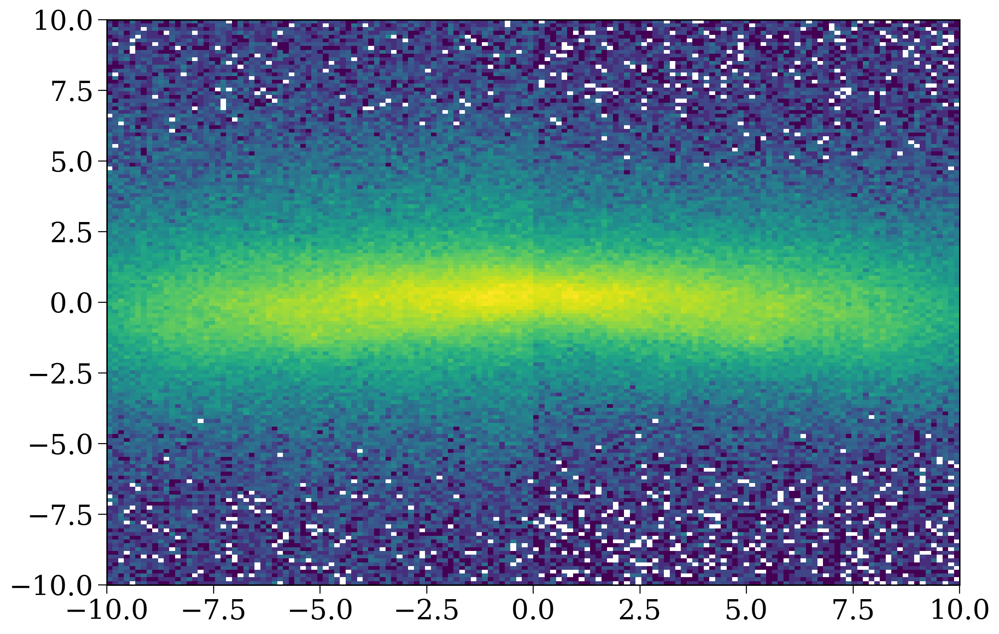

In [102]:
ratio_bins = 150

for i, key, ax in zip([0, 1], pops, axes):
    p = pops[key]
    
    any_CO = p.final_bpp["kstar_1"].isin([13, 14]) | p.final_bpp["kstar_2"].isin([13, 14])
    
    order = np.argsort(np.concatenate((p.bin_nums[~p.disrupted], p.bin_nums[p.disrupted])))
    final_pos_sec = np.concatenate((p.final_pos[:len(p)][~p.disrupted], p.final_pos[len(p):]))[order]
    pos = np.concatenate((p.final_pos[:len(p)][any_CO & ~p.disrupted], final_pos_sec[any_CO & p.disrupted]))
    
    # print(any_CO.sum())
    # print(p.disrupted.sum())
    
    abs_x = np.abs(pos[:, 0].to(u.kpc).value)
    z = pos[:, 2].to(u.kpc).value
    
    print(len(pos))
    
    plt.hist2d(abs_x * (-1 if i == 0 else 1), z, bins=ratio_bins, range=[[-10, 10], [-10, 10]], norm="log")
    # print((p.final_bpp["kstar_1"] == 13).sum())

In [78]:
ratio = np.zeros_like(Hs[1])
ratio[Hs[1] > 0.0] = (Hs[0][Hs[1] > 0.0] / Hs[1][Hs[1] > 0.0])

In [84]:
np.any(Hs[0] < 0)

False

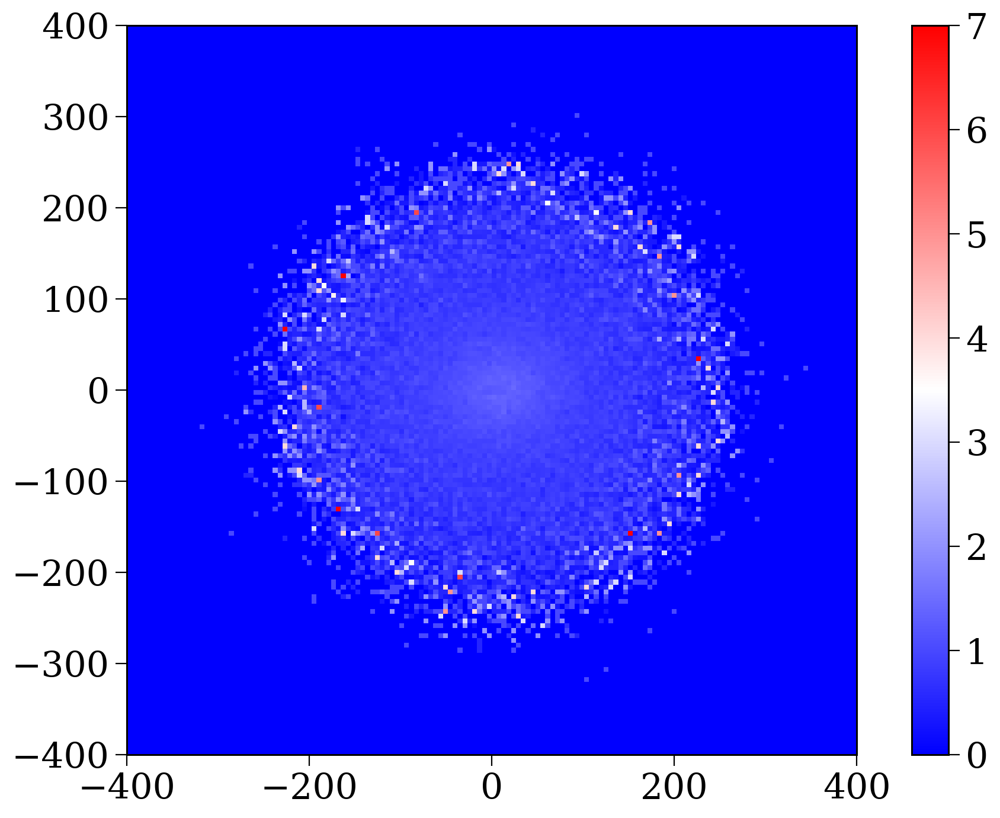

In [92]:
# cmap = plt.cm.bwr(vcenter=1)
im = plt.imshow(ratio.T, origin="lower", extent=[-400, 400, -400, 400], cmap="bwr")#, norm=mpl.colors.CenteredNorm(vcenter=1))
plt.colorbar(im)

In [54]:
Hs

[array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])]